In [300]:
import pandas as pd
import scipy.stats
import re
import numpy as np
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns




In [67]:
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None) 

In [240]:
gene = 'PTPN11'
Dcharge_model = 'DCharge'

In [324]:
calculatedProperties_df = pd.read_csv(r"\\rdp.arc.ucl.ac.uk\ritd-ag-project-rd025c-bhall50\ModellingRASopathies RDSS\PTPN11_CalculatedProperties.csv")
ClinVar_shortdf = pd.read_csv(r"\\rdp.arc.ucl.ac.uk\ritd-ag-project-rd025c-bhall50\ModellingRASopathies RDSS\PTPN11_ClinVarshort.csv")
NSEuronet_shortdf = pd.read_csv(r"\\rdp.arc.ucl.ac.uk\ritd-ag-project-rd025c-bhall50\ModellingRASopathies RDSS\PTPN11_NSEuronetshort.csv")


In [461]:
# TRYING IN REGRESSION

# Get dummies (one-hot encoding) for each unique value in DPolarityCat
DPolarityCatdummies = pd.get_dummies(calculatedProperties_df['DPolarityCat'], prefix='DPolarityCat').astype(int)

# Concatenate back to the original DataFrame
calculatedProperties_df = pd.concat([calculatedProperties_df, DPolarityCatdummies], axis=1)


In [162]:
# NOT NECESSARY UNLESS WANT IN REGRESSION

"""
# Get dummies (one-hot encoding) for each unique value in DPolarityCat
REVELpeakdummies = pd.get_dummies(calculatedProperties_df['REVELpeak'], prefix='REVELpeak').astype(int)

# Concatenate back to the original DataFrame
calculatedProperties_df = pd.concat([calculatedProperties_df, REVELpeakdummies], axis=1)
"""

In [ ]:
print(ClinVar_shortdf["Germline classification"].unique())

In [11]:
ClinVar_shortdf[ClinVar_shortdf["Germline classification"]== 'Conflicting classifications of pathogenicity']

,VariationID,AApos,AAfrom,AAto,Germline classification,PathvBen,PathvBen_incConfB
2,280283,4,R,G,Conflicting classifications of pathogenicity,<NA>,<NA>
30,561500,43,L,F,Conflicting classifications of pathogenicity,<NA>,<NA>
43,372483,58,N,S,Conflicting classifications of pathogenicity,<NA>,<NA>
46,288033,59,T,A,Conflicting classifications of pathogenicity,<NA>,<NA>
54,228392,61,D,Y,Conflicting classifications of pathogenicity,<NA>,<NA>
68,224414,69,E,K,Conflicting classifications of pathogenicity,<NA>,<NA>
80,41443,72,A,V,Conflicting classifications of pathogenicity,<NA>,<NA>
89,13336,76,E,K,Conflicting classifications of pathogenicity,<NA>,<NA>
91,13338,76,E,G,Conflicting classifications of pathogenicity,<NA>,<NA>
122,1339747,110,E,G,Conflicting classifications of pathogenicity,<NA>,<NA>


44609 - Conflicting classifications of pathogenicity
Uncertain significance(5); Likely benign(2)

40524 - Conflicting classifications of pathogenicity
Uncertain significance(4); Benign(2)

280250 - Conflicting classifications of pathogenicity
Uncertain significance(3); Likely benign(1)

181500 - Conflicting classifications of pathogenicity
Uncertain significance(5); Likely benign(1)

40540 - Conflicting classifications of pathogenicity
Uncertain significance(4); Likely benign(1)

224093 - Conflicting classifications of pathogenicity
Uncertain significance(3); Likely benign(1)

1517126 - Conflicting classifications of pathogenicity
Uncertain significance(2); Likely benign(1)

488166 - Conflicting classifications of pathogenicity
Uncertain significance(6); Likely benign(2)

279918 - Conflicting classifications of pathogenicity
Uncertain significance(2); Likely benign(2)

177887 - Conflicting classifications of pathogenicity
Uncertain significance(3); Likely benign(5)

1017240 - Conflicting classifications of pathogenicity
Uncertain significance(1); Likely benign(1)

691730 - Conflicting classifications of pathogenicity
Uncertain significance(2); Likely benign(1)

In [462]:
# Mapping Germline classification to groups (numeric version)
class_map_num = {**dict.fromkeys(['Pathogenic', 'Likely pathogenic', 'Pathogenic/Likely pathogenic'], 1),
             **dict.fromkeys(['Benign', 'Likely benign', 'Benign/Likely benign'], 0),
             **dict.fromkeys(['Uncertain significance','Uncertain significance; risk factor','Conflicting classifications of pathogenicity','other'], np.nan)}

In [463]:
# List of VariationIDs to treat as zero (benign)
conflictingbenign_ids = [
    44609, 40524, 280250, 181500, 40540, 224093, 1517126,
    488166, 279918, 177887, 1017240, 691730
]

In [464]:
# Create PathvBen directly from Germline classification
ClinVar_shortdf["PathvBen"] = ClinVar_shortdf["Germline classification"].map(class_map_num).astype("Int64")

# Create the new column based on PathvBen, forcing 0 for the conflicting IDs
ClinVar_shortdf["PathvBen_incConfB"] = np.where(
    ClinVar_shortdf["VariationID"].isin(conflictingbenign_ids),
    0,
    ClinVar_shortdf["PathvBen"]
)

In [326]:
ClinVar_shortdf

,VariationID,AApos,AAfrom,AAto,Germline classification,PathvBen,PathvBen_incConfB
0,3574257,1,M,R,Likely pathogenic,1,1.0
1,13349,2,T,I,Pathogenic/Likely pathogenic,1,1.0
2,280283,4,R,G,Conflicting classifications of pathogenicity,<NA>,NaN
3,2729546,4,R,Q,Likely pathogenic,1,1.0
4,2785856,6,W,C,Uncertain significance,<NA>,NaN
5,2568101,6,W,C,Uncertain significance,<NA>,NaN
6,2587734,10,N,Y,Uncertain significance,<NA>,NaN
7,1684677,10,N,H,Uncertain significance,<NA>,NaN
8,838860,10,N,D,Uncertain significance,<NA>,NaN
9,2705464,10,N,T,Uncertain significance,<NA>,NaN


In [327]:
# Create NoovLeo from Disease column
NSEuronet_shortdf["NoovLEO"] = NSEuronet_shortdf["Disease"].map({"Noonan syndrome": 1, "LEOPARD syndrome (Noonan syndrome with multiple lentigines)": 0}).astype("Int64")



In [328]:
NSEuronet_shortdf

,AApos,AAfrom,AAto,Disease,NoovLEO
0,2,T,I,Noonan syndrome,1
1,2,T,I,Noonan syndrome,1
2,2,T,I,NF1-Noonan syndrome,<NA>
3,2,T,I,Noonan syndrome,1
4,2,T,I,Noonan syndrome,1
5,2,T,I,Noonan syndrome,1
6,2,T,I,Noonan syndrome,1
7,2,T,I,Noonan syndrome,1
8,2,T,I,Noonan syndrome,1
9,2,T,I,Noonan syndrome,1


### Pathogenic v benign - full protein

In [465]:
logreg_data = (ClinVar_shortdf.copy()
    .dropna(subset=["PathvBen"])
    .merge(calculatedProperties_df, on = ["AApos", "AAfrom", "AAto"])
    .drop(columns=["VariationID", "Germline classification", "predREVEL", "predBD", "predBDAF"]))

logreg_data_incConfB = (ClinVar_shortdf.copy()
    .dropna(subset=["PathvBen_incConfB"])
    .merge(calculatedProperties_df, on = ["AApos", "AAfrom", "AAto"])
    .drop(columns=["VariationID", "Germline classification", "predREVEL", "predBD", "predBDAF"]))


In [466]:
numeric_cols = [
    "medianDDG", "Total_SASA", "Polar_SASA", "Apolar_SASA", "MainChain_SASA",
    "SideChain_SASA", "MoreRonn", "ConSurfScore", "activesite1DIST",
    "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST",
    "loop1DIST","loop2DIST","loop3DIST","loop4DIST","loop5DIST","loop6DIST",
    "loop7DIST","loop8DIST","loop9DIST","loop10DIST","loop11DIST","loop12DIST",
    "loop13DIST","loop14DIST","loop15DIST","loop16DIST","loop17DIST","loop18DIST",
    "loop19DIST","loop20DIST","loop21DIST","loop22DIST","loop23DIST","loop24DIST",
    "loop25DIST","loop26DIST","loop27DIST","loop28DIST","loop29DIST",
    "hinge1DIST","hinge2DIST","DPolarity","DHydrophobicity"
]

# Make proper copies
logreg_data_norm = logreg_data.copy()
logreg_data_incConfB_norm = logreg_data_incConfB.copy()

# Fit standard scaler on training-like dataset
scaler = StandardScaler()
scaler.fit(logreg_data[numeric_cols])

# Apply to both
logreg_data_norm[numeric_cols] = scaler.transform(logreg_data[numeric_cols])
logreg_data_incConfB_norm[numeric_cols] = scaler.transform(logreg_data_incConfB[numeric_cols])

In [467]:
logreg_data_incConfB_norm.head()

,AApos,AAfrom,AAto,PathvBen,PathvBen_incConfB,REVEL,BayesDel_noAF,BayesDel_addAF,predREVELnum,predBDnum,predBDAFnum,REVELpeak,BDpeak,BDAFpeak,medianDDG,Total_SASA,Polar_SASA,Apolar_SASA,MainChain_SASA,SideChain_SASA,MoreRonn,ConSurfScore,ConSurfGrade,activesite1DIST,bindingsite1DIST,bindingsite2DIST,bindingsite3DIST,loop1DIST,loop2DIST,loop3DIST,loop4DIST,loop5DIST,loop6DIST,loop7DIST,loop8DIST,loop9DIST,loop10DIST,loop11DIST,loop12DIST,loop13DIST,loop14DIST,loop15DIST,loop16DIST,loop17DIST,loop18DIST,loop19DIST,loop20DIST,loop21DIST,loop22DIST,loop23DIST,loop24DIST,loop25DIST,loop26DIST,loop27DIST,loop28DIST,loop29DIST,hinge1DIST,hinge2DIST,Domain_SH2_1,Domain_SH2_2,Domain_TPP,DCharge,DPolarity,DPolarityCat,DHydrophobicity,DPolarityCat_NN,DPolarityCat_NP,DPolarityCat_Nneg,DPolarityCat_Npos,DPolarityCat_PN,DPolarityCat_PP,DPolarityCat_Pneg,DPolarityCat_Ppos,DPolarityCat_negN,DPolarityCat_negP,DPolarityCat_negneg,DPolarityCat_negpos,DPolarityCat_posN,DPolarityCat_posP,DPolarityCat_posneg,DPolarityCat_pospos
0,1,M,R,1,1.0,0.202,0.660000,0.660000,0,1,1,0.0,1.0,1.0,-0.507238,NaN,NaN,NaN,NaN,NaN,-0.026034,-0.121691,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,1,2.005980,Npos,-2.282033,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,2,T,I,1,1.0,0.213,0.010807,0.010807,0,0,0,0.0,0.0,0.0,-0.553315,1.815430,1.882271,1.001607,6.353477,0.668311,-0.195478,2.024646,3.0,1.037031,1.046272,0.824897,0.682519,-1.953465,-1.707014,0.449500,-1.414209,0.182146,-0.963619,-0.694937,-0.659646,-0.492034,-1.120824,-1.420175,-0.425523,0.145596,-0.971230,-0.259204,0.456490,0.608787,0.756825,0.784790,1.074301,0.731024,1.288862,0.911155,1.216690,0.861535,0.815196,0.337749,0.725448,1.177950,-1.432885,-0.014328,0,0,0,0,-1.079126,PN,1.440337,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,4,R,Q,1,1.0,0.393,-0.022043,-0.022043,0,0,0,0.0,0.0,0.0,-0.032029,-0.607519,-0.425213,-0.641882,-0.522473,-0.525392,-0.235441,0.393554,6.0,0.440141,0.192295,0.329347,-0.145660,-1.953465,-1.388256,-0.710982,-0.973616,-0.261909,-1.151994,-0.868963,-1.168779,-0.604960,-1.590147,-1.809845,-0.729748,-1.144626,-0.559804,0.330552,0.476625,0.399338,0.616340,0.687904,0.639191,0.736828,0.542133,0.757761,0.284680,0.613828,0.318622,-0.186041,0.207822,0.316477,-1.599367,-0.684461,0,0,0,-1,0.200064,posP,0.092582,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,18,N,S,0,0.0,0.301,-0.292277,-0.292277,0,0,0,0.0,0.0,0.0,-0.580107,2.336366,3.037614,0.367103,-0.154310,2.427632,-0.620947,4.445677,1.0,2.512916,1.614188,2.570106,2.287031,-0.860276,-2.499066,-0.181535,-2.736219,1.695270,-0.776256,1.131247,-1.097951,1.376455,-2.212061,-1.205411,1.621308,1.067197,2.024089,2.037555,2.502154,3.365264,2.482422,2.929576,1.832974,2.490223,2.340643,2.795109,1.839930,3.029490,2.564008,2.787119,2.747355,2.631434,-1.267297,1.718608,1,0,0,0,-0.702894,PP,0.638102,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,31,A,G,1,1.0,0.720,0.263101,0.263101,1,1,1,0.5,0.5,0.5,-0.182625,-0.782304,-0.672175,-0.639800,-0.522473,-0.704832,1.878200,0.157659,7.0,1.019594,0.520669,0.909460,0.584292,-1.628713,-2.053852,-1.028667,-1.732375,0.368182,-1.099691,0.102847,-0.958743,0.421109,-1.527138,-1.312256,0.299165,-0.423131,0.303676,0.672983,0.995389,1.465456,1.036657,1.377549,0.822634,1.155860,1.117268,1.368323,0.751775,1.385993,0.899932,0.883515,0.969833,1.183304,-1.553143,0.259778,1,0,0,0,0.538673,NN,-0.934279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [508]:
logreg_y = logreg_data_incConfB_norm[["PathvBen_incConfB"]]
logreg_x = logreg_data_incConfB_norm[[#"REVEL",# "BayesDel_noAF", "BayesDel_addAF", "predREVELnum", "predBDnum", "predBDAFnum",
                                 #"REVELpeak", "BDpeak", "BDAFpeak",
                                 #"medianDDG", 
                                 #"Total_SASA", #"Polar_SASA", "Apolar_SASA", "MainChain_SASA","SideChain_SASA",
                                 #"MoreRonn",
                                "ConSurfScore", #"ConSurfGrade",
                                 #"activesite1DIST", 
                                #"bindingsite1DIST", "bindingsite2DIST", 
                                #"bindingsite3DIST",
                                #"hinge1DIST", "hinge2DIST",
                                 #"loop29DIST", # only one with low correlation
                                 #"loop1DIST", "loop2DIST", "loop3DIST", "loop4DIST","loop5DIST", "loop7DIST", "loop8DIST", "loop9DIST", "loop10DIST","loop11DIST", "loop13DIST", "loop14DIST", "loop15DIST", "loop16DIST","loop17DIST", "loop18DIST","loop19DIST", "loop20DIST", "loop21DIST", "loop22DIST","loop23DIST", "loop25DIST","loop27DIST", = v highly correlated 
                                 #"loop6DIST","loop12DIST","loop24DIST", "loop26DIST","loop28DIST", = overlamp wih active, binding, hinges
                                 #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                                 #"DCharge", "DHydrophobicity","DPolarity",
                                 #"DPolarityCat_NN", "DPolarityCat_NP", "DPolarityCat_PN", "DPolarityCat_PP",
                                #"DPolarityCat_negN", "DPolarityCat_Ppos", "DPolarityCat_posN", "DPolarityCat_posP","DPolarityCat_Nneg","DPolarityCat_Npos", "DPolarityCat_Pneg",
                                #"DPolarityCat_negpos", "DPolarityCat_posneg"
                                 #"DPolarityCat_negneg", "DPolarityCat_pospos",
                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

In [53]:
# Missense mutations in disordered region are benign

In [509]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

Optimization terminated successfully.
         Current function value: 0.606264
         Iterations 6


In [510]:
print(log_reg.summary())

# Negative pseudo R-squ is it because teh null model is dominantly strong because the data is heavily skewed towards pathogenic
# Add class weights?

                           Logit Regression Results                           
Dep. Variable:      PathvBen_incConfB   No. Observations:                  160
Model:                          Logit   Df Residuals:                      159
Method:                           MLE   Df Model:                            0
Date:                Wed, 03 Dec 2025   Pseudo R-squ.:                 -0.4725
Time:                        17:28:18   Log-Likelihood:                -97.002
converged:                       True   LL-Null:                       -65.874
Covariance Type:            nonrobust   LLR p-value:                       nan
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
ConSurfScore    -0.9568      0.234     -4.084      0.000      -1.416      -0.498


In [504]:
print(log_reg.pvalues)

Total_SASA          0.613017
ConSurfScore        0.000266
bindingsite3DIST    0.203380
hinge1DIST          0.945084
hinge2DIST          0.192809
loop29DIST          0.246423
dtype: float64


##### Find optimal cutoffs

In [539]:
def compute_optimal_threshold(df, score, label_col="PathvBen_incConfB"):

    df_roc = df[[score, label_col]].dropna().copy()
    y = df_roc[label_col].astype(int)
    x = df_roc[score]

    # compute raw and inverted AUC
    auc_raw = roc_auc_score(y, x)
    auc_inv = roc_auc_score(y, -x)

    # choose best orientation
    if auc_inv > auc_raw:
        invert = True
        df_roc["score_used"] = -x
        auc_val = auc_inv
    else:
        invert = False
        df_roc["score_used"] = x
        auc_val = auc_raw

    # compute ROC on oriented score
    fpr, tpr, thresholds_used = roc_curve(y, df_roc["score_used"])

    # Youden J
    J = tpr - fpr
    idx = np.argmax(J)
    thr_internal = thresholds_used[idx]

    # convert threshold back to original scale
    thr_original = -thr_internal if invert else thr_internal

    return {
        "score": score,
        "invert": invert,
        "auc": auc_val,
        "threshold_internal": thr_internal,
        "threshold_original": thr_original,
        "roc_curve": (fpr, tpr, thresholds_used),
        "optimal_idx": idx,
        "auc_raw": auc_raw,
        "auc_inverted": auc_inv,
    }


In [538]:
def compute_fpr_fnr(df, feature, roc_data, label_col="PathvBen_incConfB"):

    thr = roc_data["threshold_original"]
    invert = roc_data["invert"]

    df_eval = df[[feature, label_col]].dropna().copy()
    df_eval["label"] = df_eval[label_col].astype(int)

    # Apply threshold
    if invert:
        df_eval["pred"] = (df_eval[feature] < thr).astype(int)
    else:
        df_eval["pred"] = (df_eval[feature] >= thr).astype(int)

    y_true = df_eval["label"]
    y_pred = df_eval["pred"]

    TN = ((y_true == 0) & (y_pred == 0)).sum()
    FP = ((y_true == 0) & (y_pred == 1)).sum()
    FN = ((y_true == 1) & (y_pred == 0)).sum()
    TP = ((y_true == 1) & (y_pred == 1)).sum()

    FPR = FP / (FP + TN) if (FP + TN) > 0 else np.nan
    FNR = FN / (FN + TP) if (FN + TP) > 0 else np.nan

    return FPR, FNR

In [556]:
def plotROC_all_features(df, features, label_col="PathvBen_incConfB", gene=None,title=None):

    n = len(features)
    ncols = 5
    nrows = (n + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows))
    axes = axes.flatten()
    results = {}

    for i, feature in enumerate(features):

        # Compute ROC
        roc_data = compute_optimal_threshold(df=df, score=feature, label_col=label_col)
        results[feature] = roc_data

        # Compute FPR & FNR
        FPR, FNR = compute_fpr_fnr(df=df, feature=feature, roc_data=roc_data, label_col=label_col)

        fpr_curve, tpr_curve, thresholds = roc_data["roc_curve"]
        auc_val = roc_data["auc"]
        idx = roc_data["optimal_idx"]
        thr_original = roc_data["threshold_original"]
        invert = roc_data["invert"]

        # Label indicating inversion
        inv_label = " (inverted)" if invert else ""  

        # Plot ROC
        ax = axes[i]
        ax.plot(fpr_curve, tpr_curve, linewidth=2)
        ax.plot([0, 1], [0, 1], "--", color="gray")

        # Highlight optimal threshold point
        ax.scatter(fpr_curve[idx], tpr_curve[idx], color="red", s=40, zorder=5)
        ax.annotate(
            f"Thr={thr_original:.2f}{inv_label}",
            xy=(fpr_curve[idx], tpr_curve[idx]),
            xytext=(fpr_curve[idx] + 0.03, tpr_curve[idx] - 0.05),
            fontsize=8,
            color="black"
        )

        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)

        # Title includes AUC, FPR, FNR, AND inversion indicator
        ax.set_title(
            f"{feature}{inv_label}\n"
            f"AUC={auc_val:.3f}  FPR={FPR:.2f}  FNR={FNR:.2f}",
            fontsize=10
        )

    # Hide any leftover axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(title, fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    return results


In [576]:


def plotBox_all_features(df, features, label_col, title=None):


    n = len(features)
    ncols = 4
    nrows = (n + ncols - 1) // ncols

    fig, axes = plt.subplots(nrows, ncols, figsize=(20, 4.8 * nrows))
    axes = axes.flatten()

    # Use consistent palette
    palette = {0: "lightblue", 1: "salmon"}
    # Or reversed: {0:"salmon",1:"lightblue"}

    for i, feature in enumerate(features):
        ax = axes[i]

        sns.boxplot(
            data=df,
            x=label_col,
            y=feature,
            hue=label_col,
            palette=palette,
            legend=False,   # suppress repeated legends
            ax=ax
        )

        ax.set_title(feature, fontsize=11)
        ax.set_xlabel(label_col)
        ax.set_ylabel("Value")

    # Hide unused
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    # ---- ONE LEGEND FOR THE WHOLE PLOT ----
    import matplotlib.patches as mpatches
    handles = [mpatches.Patch(color=palette[k], label=str(k)) for k in palette]
    fig.legend(handles=handles, title=label_col, loc="upper right")


    plt.suptitle(title, fontsize=18)
    plt.tight_layout(rect=[0, 0, 0.90, 0.96])  # leave space for legend
    plt.show()


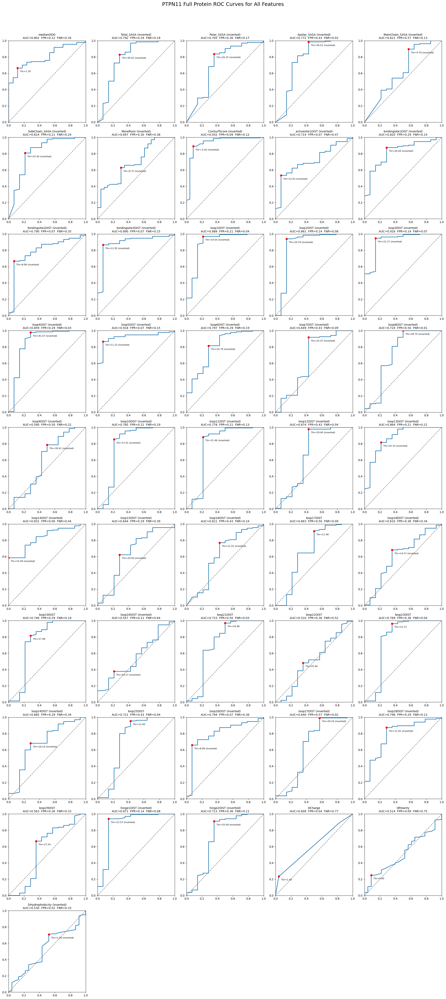

In [554]:
all_features = [
    "medianDDG", "Total_SASA", "Polar_SASA", "Apolar_SASA", "MainChain_SASA",
    "SideChain_SASA", "MoreRonn", "ConSurfScore",
    "activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST"
] + [f"loop{i}DIST" for i in range(1, 30)] + [
    "hinge1DIST", "hinge2DIST",
    "DCharge", "DPolarity", "DHydrophobicity"
]


results_all = plotROC_all_features(
    df=logreg_data_incConfB,
    features=all_features,
    label_col="PathvBen_incConfB",
    gene=gene,
    title = f"{gene} Full Protein ROC Curves for All Features"
)

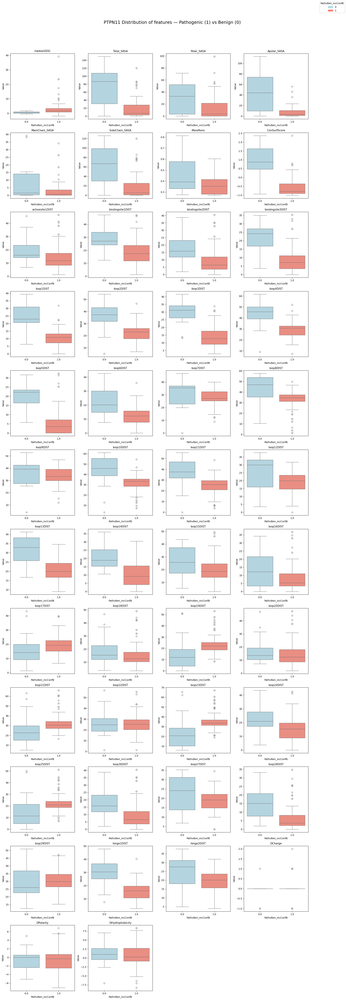

In [578]:
plotBox_all_features(
    df=logreg_data_incConfB,
    features=all_features,
    label_col="PathvBen_incConfB",
    title=f"{gene} Distribution of features — Pathogenic (1) vs Benign (0)"
)


In [295]:
counts = pd.crosstab(
    logreg_data_incConfB["DPolarityCat"],
    logreg_data_incConfB["PathvBen_incConfB"]
)

display(counts)


PathvBen_incConfB,0.0,1.0
DPolarityCat,,
NN,7,26
NP,2,16
Nneg,0,2
Npos,0,8
PN,3,16
PP,4,15
Pneg,0,5
Ppos,1,14
negN,0,12


PathvBen_incConfB,0.0,1.0
DPolarityCat,,
NN,30.434783,18.978102
NP,8.695652,11.678832
Nneg,0.000000,1.459854
Npos,0.000000,5.839416
PN,13.043478,11.678832
PP,17.391304,10.948905
Pneg,0.000000,3.649635
Ppos,4.347826,10.218978
negN,0.000000,8.759124


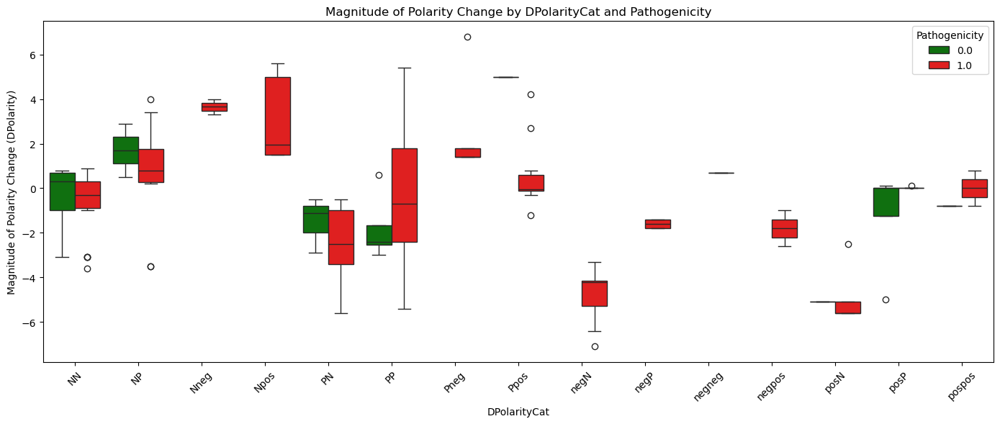

In [440]:
plt.figure(figsize=(14,6))
sns.boxplot(
    data=logreg_data_incConfB,
    x='DPolarityCat',
    y='DPolarity',
    hue='PathvBen_incConfB',  # 0 = benign, 1 = pathogenic
    palette={0:'green', 1:'red'},
    order = sorted(logreg_data_incConfB["DPolarityCat"].unique())

)
plt.xticks(rotation=45)
plt.xlabel("DPolarityCat")
plt.ylabel("Magnitude of Polarity Change (DPolarity)")
plt.title("Magnitude of Polarity Change by DPolarityCat and Pathogenicity")
plt.legend(title="Pathogenicity", loc='upper right')
plt.tight_layout()
plt.show()


##### Are neutral / conservative substitutoins that are pathogenic in conserved sites?

In [448]:
df_nc_all = logreg_data_incConfB[
    (logreg_data_incConfB['DPolarityCat'].isin(["NN", "PP", "PN", "NP"])) 
    #& (logreg_data_incConfB['PathvBen_incConfB'] == 1)  # pathogenic
]


In [443]:
df_nc_pathogenic

,AApos,AAfrom,AAto,PathvBen,PathvBen_incConfB,REVEL,BayesDel_noAF,BayesDel_addAF,predREVELnum,predBDnum,predBDAFnum,REVELpeak,BDpeak,BDAFpeak,medianDDG,Total_SASA,Polar_SASA,Apolar_SASA,MainChain_SASA,SideChain_SASA,MoreRonn,ConSurfScore,ConSurfGrade,activesite1DIST,bindingsite1DIST,bindingsite2DIST,bindingsite3DIST,loop1DIST,loop2DIST,loop3DIST,loop4DIST,loop5DIST,loop6DIST,loop7DIST,loop8DIST,loop9DIST,loop10DIST,loop11DIST,loop12DIST,loop13DIST,loop14DIST,loop15DIST,loop16DIST,loop17DIST,loop18DIST,loop19DIST,loop20DIST,loop21DIST,loop22DIST,loop23DIST,loop24DIST,loop25DIST,loop26DIST,loop27DIST,loop28DIST,loop29DIST,hinge1DIST,hinge2DIST,Domain_SH2_1,Domain_SH2_2,Domain_TPP,DCharge,DPolarity,DPolarityCat,DHydrophobicity
1,2,T,I,1,1.0,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.629094,30.619216,24.601382,39.540737,37.286003,43.923780,25.572965,29.902617,16.440256,20.706048,11.813074,37.976353,6.411087,19.448170,0,0,0,0,-3.4,PN,5.2
4,31,A,G,1,1.0,0.720000,0.263101,0.263101,1,1,1,0.5,0.5,0.5,1.967990,0.026775,0.000000,0.026775,0.000000,0.026775,0.549622,-0.411,7.0,23.690307,23.564840,17.151697,13.574106,1.858981,8.224619,7.315391,16.753727,9.178688,5.569428,27.941515,23.598616,36.363001,18.691427,14.545210,21.040822,18.041340,12.958237,26.752310,16.589372,29.715905,25.235383,36.150058,22.309783,43.787586,35.759012,48.391813,21.736635,34.488269,17.151697,23.957117,13.574106,38.014251,5.569428,21.149415,1,0,0,0,0.9,NN,-2.2
5,42,T,S,1,1.0,0.612000,-0.040817,-0.040817,0,0,0,0.0,0.0,0.0,1.444150,11.445178,6.632002,4.813176,0.025648,11.419530,0.525351,-0.948,9.0,22.853055,19.805942,17.559373,12.950933,5.894849,10.319367,3.323857,15.646190,7.238577,9.354644,32.454236,27.982368,40.527135,22.324404,19.530514,23.351690,18.786881,16.688341,28.506079,16.817281,31.937980,25.334159,37.530251,17.936932,43.747389,33.349902,48.840566,17.699294,35.862933,17.559373,25.863404,12.950933,36.988655,9.354644,23.351690,1,0,0,0,0.6,PP,-0.1
6,42,T,A,1,1.0,0.794000,0.144697,0.144697,1,0,0,0.5,0.5,0.5,0.841481,11.445178,6.632002,4.813176,0.025648,11.419530,0.525351,-0.948,9.0,22.853055,19.805942,17.559373,12.950933,5.894849,10.319367,3.323857,15.646190,7.238577,9.354644,32.454236,27.982368,40.527135,22.324404,19.530514,23.351690,18.786881,16.688341,28.506079,16.817281,31.937980,25.334159,37.530251,17.936932,43.747389,33.349902,48.840566,17.699294,35.862933,17.559373,25.863404,12.950933,36.988655,9.354644,23.351690,1,0,0,0,-0.5,PN,2.5
7,52,T,I,1,1.0,0.912000,0.396525,0.396525,1,1,1,1.0,0.5,0.5,-1.067360,21.669485,15.005238,6.664247,4.146764,17.522721,0.328077,-0.859,9.0,30.215356,27.402055,24.274253,21.460736,10.399249,6.678809,11.652827,7.382806,8.712388,3.515767,38.442406,31.646116,46.894514,23.756816,23.027886,31.781179,27.913898,21.177241,29.955274,18.661904,39.674875,29.745970,43.733231,23.094225,46.997548,41.545080,53.185100,25.326491,42.825873,24.274253,34.503357,21.460736,46.596568,3.931632,31.958206,1,0,0,0,-3.4,PN,5.2
8,56,I,V,1,1.0,0.772000,0.160158,0.160158,1,0,0,0.5,0.5,0.5,1.370380,0.030827,0.000000,0.030827,0.000000,0.030827,0.302085,-0.950,9.0,17.362870,14.911291,11.857840,8.720940,7.782785,12.640761,4.225967,18.937448,3.301631,8.129106,33.536545,32.216528,40.961582,27.166832,22.600053,24.118549,19.733416,13.713512,23.497265,11.009593,28.486094,18.971672,31.955099,12.919137,37.366057,28.577674,42.566306,13.725492,30.646812,11.857840,25.267376,8.720940,34.608792,8.180292,24.118549,1,0,0,0,0.7,NN,-0.3
9,56,I,T,1,1.0,0.969000,0.605674,0.605674,1,1,1,1.0,1.0,1.0,3.968670,0.030827,0.000000,0.030827,0.000000,0.030827,0.302085,-0.950,9.0,17.362870,14.911291,11.857840,8.720940,7.782785,12.640761,4.225967,18.937448,3.301631,8.129106,33.536545,32.216528,40.961582,27.

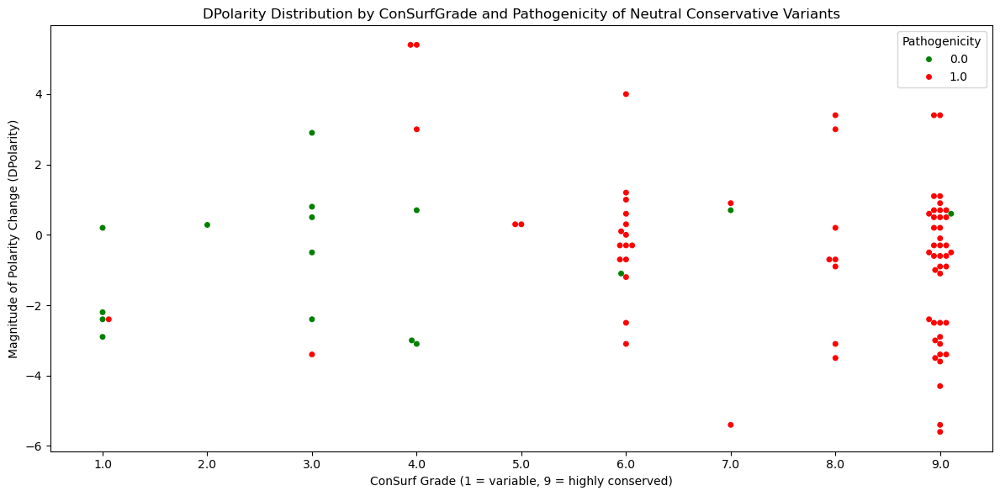

In [584]:
plt.figure(figsize=(12,6))
sns.swarmplot(
    data=df_nc_all,
    x='ConSurfGrade',        # discrete site conservation
    y='DPolarity',           # magnitude of polarity change
    hue='PathvBen_incConfB', # 0=benign, 1=pathogenic
    palette={0:'green', 1:'red'}
)
plt.xlabel("ConSurf Grade (1 = variable, 9 = highly conserved)")
plt.ylabel("Magnitude of Polarity Change (DPolarity)")
plt.title("DPolarity Distribution by ConSurfGrade and Pathogenicity of Neutral Conservative Variants")
plt.legend(title="Pathogenicity", loc='upper right')
plt.tight_layout()
plt.show()


In [454]:
# What about posP

df_posP = logreg_data_incConfB[
    (logreg_data_incConfB['DPolarityCat'].isin(["posP"])) 
    #& (logreg_data_incConfB['PathvBen_incConfB'] == 1)  # pathogenic
]


In [457]:
df_posP

,AApos,AAfrom,AAto,PathvBen,PathvBen_incConfB,REVEL,BayesDel_noAF,BayesDel_addAF,predREVELnum,predBDnum,predBDAFnum,REVELpeak,BDpeak,BDAFpeak,medianDDG,Total_SASA,Polar_SASA,Apolar_SASA,MainChain_SASA,SideChain_SASA,MoreRonn,ConSurfScore,ConSurfGrade,activesite1DIST,bindingsite1DIST,bindingsite2DIST,bindingsite3DIST,loop1DIST,loop2DIST,loop3DIST,loop4DIST,loop5DIST,loop6DIST,loop7DIST,loop8DIST,loop9DIST,loop10DIST,loop11DIST,loop12DIST,loop13DIST,loop14DIST,loop15DIST,loop16DIST,loop17DIST,loop18DIST,loop19DIST,loop20DIST,loop21DIST,loop22DIST,loop23DIST,loop24DIST,loop25DIST,loop26DIST,loop27DIST,loop28DIST,loop29DIST,hinge1DIST,hinge2DIST,Domain_SH2_1,Domain_SH2_2,Domain_TPP,DCharge,DPolarity,DPolarityCat,DHydrophobicity
2,4,R,Q,1,1.0,0.393,-0.022043,-0.022043,0,0,0,0.0,0.0,0.0,2.706995,4.758575,4.758575,0.000000,0.000000,4.758575,0.346683,-0.259,6.0,18.542086,20.634759,12.271084,8.083067,0.000000,13.012406,9.499832,22.490056,4.483895,5.245919,21.018291,21.585187,28.936645,18.151443,10.572284,14.224788,13.824156,6.725169,23.605290,12.397988,22.155056,21.320649,29.715197,20.639404,39.598751,30.640955,42.424617,17.882326,27.736771,12.271084,17.585895,8.083067,31.879151,5.245919,15.288975,0,0,0,-1,0.0,posP,1.0
81,265,R,Q,1,1.0,0.814,0.336860,0.336860,1,1,1,0.5,0.5,0.5,0.972114,27.438012,27.072249,0.365763,3.637044,23.800969,0.530582,-0.791,9.0,15.208242,23.051788,8.887470,10.332601,9.202371,19.045546,18.659143,26.149176,5.291297,7.858116,30.197380,38.218207,35.158769,34.245542,25.886097,24.700120,27.923392,0.000000,5.168342,2.455353,18.676716,10.708906,18.168799,15.788908,25.198461,29.866576,29.918418,21.481297,19.427191,8.887470,23.163556,4.204280,36.805085,12.923564,25.237197,0,0,1,-1,0.0,posP,1.0
98,293,H,Q,<NA>,0.0,0.395,-0.213065,-0.213065,0,0,0,0.0,0.0,0.0,-0.347201,149.471556,56.077513,93.394043,39.146844,110.324713,0.382402,1.897,1.0,20.580347,34.204662,19.926985,25.780007,29.447187,40.902628,37.028274,47.970402,23.467478,26.170656,37.199778,54.048136,39.711193,52.641216,43.567154,34.294878,41.302749,15.598641,11.772646,0.000000,17.624669,15.668882,5.062491,17.621427,9.661374,31.513192,10.768745,28.647111,11.555748,19.926985,30.341505,15.551027,37.273124,35.216319,34.294878,0,0,1,0,0.1,posP,-0.3
106,343,R,Q,0,0.0,0.600,0.178878,0.178878,0,0,0,0.0,0.5,0.5,1.772650,27.759945,11.686912,16.073033,1.309803,26.450142,0.276138,0.585,4.0,16.045504,27.914000,16.045504,24.447828,31.269096,40.978253,34.782100,46.216481,22.971517,24.402708,41.760969,57.592010,45.373727,56.223279,47.485462,36.857151,41.077532,16.783277,11.597723,1.930237,17.968110,8.488269,4.024169,9.175470,4.999048,24.951712,9.274694,22.713674,10.433325,16.045504,31.487349,14.532044,35.323809,34.530114,36.287591,0,0,1,-1,0.0,posP,1.0
108,351,R,Q,0,0.0,0.516,0.091319,0.091319,0,0,0,0.0,0.0,0.0,1.059210,40.887984,40.887984,0.000000,0.000000,40.887984,0.337001,-0.174,6.0,15.691738,26.456696,15.691738,23.877138,33.067062,47.408089,34.219546,54.155400,23.279679,33.237837,36.186656,52.616816,40.189222,56.194538,47.715132,30.103323,36.198907,25.052381,26.858072,12.547667,9.087449,14.917996,0.000000,10.349068,15.141981,16.351305,6.038613,16.888289,3.274485,15.691738,23.660202,16.419417,24.240961,40.597920,27.395522,0,0,1,-1,0.0,posP,1.0
114,458,H,Q,1,1.0,0.900,0.518496,0.518496,1,1,1,1.0,1.0,1.0,1.651970,0.315111,0.066461,0.248649,0.000000,0.315111,0.339767,-0.947,9.0,1.328001,13.814907,1.328001,11.777744,22.326105,36.011495,20.874672,41.671680,9.055242,25.866728,35.069752,46.033455,40.395207,46.827485,39.420214,26.404561,27.510289,16.598324,20.214534,6.919422,12.221188,3.366766,10.345194,1.845280,16.533400,11.906002,18.807061,7.951430,10.293878,1.328001,21.174198,7.605652,23.274004,29.032572,25.514901,0,0,1,0,0.1,posP,-0.3
129,498,R,Q,1,1.0,0.964,0.494782,0.494782,1,1,1,1.0,1.0,1.0,3.882205,6.965764,2.792883,4.172881,0.676536,6.289228,0.478055,-0.938,9.0,12.345431,17.488659,6.523426,4.537072,6.755212,23.138628,11.621452,31.865188,6.031307,10.211398,20.574385,28.280051,26

#### Classifying first & middle peak of BayesDel

In [332]:
# REVELpeak
display(pd.crosstab(
    logreg_data_incConfB["REVELpeak"],
    logreg_data_incConfB["PathvBen_incConfB"],
    rownames=["REVELpeak"],
    colnames=["Pathogenicity"]
))

# BDpeak
display(pd.crosstab(
    logreg_data_incConfB["BDpeak"],
    logreg_data_incConfB["PathvBen_incConfB"],
    rownames=["BDpeak"],
    colnames=["Pathogenicity"]
))

# BDAFpeak
display(pd.crosstab(
    logreg_data_incConfB["BDAFpeak"],
    logreg_data_incConfB["PathvBen_incConfB"],
    rownames=["BDAFpeak"],
    colnames=["Pathogenicity"]
))


Pathogenicity,0.0,1.0
REVELpeak,,
0.0,21,17
0.5,1,35
1.0,1,85


Pathogenicity,0.0,1.0
BDpeak,,
0.0,18,15
0.5,5,52
1.0,0,70


Pathogenicity,0.0,1.0
BDAFpeak,,
0.0,18,15
0.5,5,52
1.0,0,70


In [422]:
logreg_data_incConfB_BD05 = logreg_data_incConfB[
    logreg_data_incConfB["BDpeak"].isin([0,0.5])
].copy()

logreg_data_incConfB_norm_BD05 = logreg_data_incConfB_norm[
    logreg_data_incConfB["BDpeak"].isin([0,0.5])
].copy()

In [423]:
logreg_data_incConfB_norm_BD05

,AApos,AAfrom,AAto,PathvBen,PathvBen_incConfB,REVEL,BayesDel_noAF,BayesDel_addAF,predREVELnum,predBDnum,predBDAFnum,REVELpeak,BDpeak,BDAFpeak,medianDDG,Total_SASA,Polar_SASA,Apolar_SASA,MainChain_SASA,SideChain_SASA,MoreRonn,ConSurfScore,ConSurfGrade,activesite1DIST,bindingsite1DIST,bindingsite2DIST,bindingsite3DIST,loop1DIST,loop2DIST,loop3DIST,loop4DIST,loop5DIST,loop6DIST,loop7DIST,loop8DIST,loop9DIST,loop10DIST,loop11DIST,loop12DIST,loop13DIST,loop14DIST,loop15DIST,loop16DIST,loop17DIST,loop18DIST,loop19DIST,loop20DIST,loop21DIST,loop22DIST,loop23DIST,loop24DIST,loop25DIST,loop26DIST,loop27DIST,loop28DIST,loop29DIST,hinge1DIST,hinge2DIST,Domain_SH2_1,Domain_SH2_2,Domain_TPP,DCharge,DPolarity,DPolarityCat,DHydrophobicity
1,2,T,I,1,1.0,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,-0.553315,1.815430,1.882271,1.001607,6.353477,0.668311,-0.195478,2.024646,3.0,1.037031,1.046272,0.824897,0.682519,-1.953465,-1.707014,0.449500,-1.414209,0.182146,-0.963619,-0.694937,-0.659646,-0.492034,-1.120824,-1.420175,-0.425523,0.145596,-0.971230,-0.259204,0.456490,0.608787,0.756825,0.784790,1.074301,0.731024,1.288862,0.911155,1.216690,0.861535,0.815196,0.337749,0.725448,1.177950,-1.432885,-0.014328,0,0,0,0,-1.079126,PN,1.440337
2,4,R,Q,1,1.0,0.393000,-0.022043,-0.022043,0,0,0,0.0,0.0,0.0,-0.032029,-0.607519,-0.425213,-0.641882,-0.522473,-0.525392,-0.235441,0.393554,6.0,0.440141,0.192295,0.329347,-0.145660,-1.953465,-1.388256,-0.710982,-0.973616,-0.261909,-1.151994,-0.868963,-1.168779,-0.604960,-1.590147,-1.809845,-0.729748,-1.144626,-0.559804,0.330552,0.476625,0.399338,0.616340,0.687904,0.639191,0.736828,0.542133,0.757761,0.284680,0.613828,0.318622,-0.186041,0.207822,0.316477,-1.599367,-0.684461,0,0,0,-1,0.200064,posP,0.092582
3,18,N,S,0,0.0,0.301000,-0.292277,-0.292277,0,0,0,0.0,0.0,0.0,-0.580107,2.336366,3.037614,0.367103,-0.154310,2.427632,-0.620947,4.445677,1.0,2.512916,1.614188,2.570106,2.287031,-0.860276,-2.499066,-0.181535,-2.736219,1.695270,-0.776256,1.131247,-1.097951,1.376455,-2.212061,-1.205411,1.621308,1.067197,2.024089,2.037555,2.502154,3.365264,2.482422,2.929576,1.832974,2.490223,2.340643,2.795109,1.839930,3.029490,2.564008,2.787119,2.747355,2.631434,-1.267297,1.718608,1,0,0,0,-0.702894,PP,0.638102
4,31,A,G,1,1.0,0.720000,0.263101,0.263101,1,1,1,0.5,0.5,0.5,-0.182625,-0.782304,-0.672175,-0.639800,-0.522473,-0.704832,1.878200,0.157659,7.0,1.019594,0.520669,0.909460,0.584292,-1.628713,-2.053852,-1.028667,-1.732375,0.368182,-1.099691,0.102847,-0.958743,0.421109,-1.527138,-1.312256,0.299165,-0.423131,0.303676,0.672983,0.995389,1.465456,1.036657,1.377549,0.822634,1.155860,1.117268,1.368323,0.751775,1.385993,0.899932,0.883515,0.969833,1.183304,-1.553143,0.259778,1,0,0,0,0.538673,NN,-0.934279
5,42,T,S,1,1.0,0.612000,-0.040817,-0.040817,0,0,0,0.0,0.0,0.0,-0.289374,-0.360527,-0.327985,-0.267564,-0.517304,-0.272794,1.625414,-0.675735,9.0,0.925358,0.099409,0.957916,0.501451,-0.923674,-1.762641,-1.609158,-1.878871,0.107798,-0.487729,0.736295,-0.501441,0.996451,-1.103223,-0.687872,0.648002,-0.295581,0.820415,0.863813,1.023597,1.778779,1.047263,1.525469,0.342402,1.151839,0.846547,1.414239,0.262499,1.543213,0.948489,1.203530,0.883353,1.038398,-1.012303,0.614611,1,0,0,0,0.425804,PP,-0.260401
6,42,T,A,1,1.0,0.794000,0.144697,0.144697,1,0,0,0.5,0.5,0.5,-0.412187,-0.360527,-0.327985,-0.267564,-0.517304,-0.272794,1.625414,-0.675735,9.0,0.925358,0.099409,0.957916,0.501451,-0.923674,-1.762641,-1.609158,-1.878871,0.107798,-0.487729,0.736295,-0.501441,0.996451,-1.103223,-0.687872,0.648002,-0.295581,0.820415,0.863813,1.023597,1.778779,1.047263,1.525469,0.342402,1.151839,0.846547,1.414239,0.262499,1.543213,0.948489,1.203530,0.883353,1.038398,-1.012303,0.614611,1,0,0,0,0.011948,PN,0.573923
7,52,T,I,1,1.0,0.912000,0.396525,0.396525,1,1,1,1.0,0.5,0.5,-0.801173,0.017142,0.106572,-0.123608,0.313273,-0.041347,-0.429225,-0.537612,9.0,1.754014,0.950706,1.756051,1.632703,-0.136785,-2.268750,-0.397871,-2.971890,0.305599,-1.431710,1.576852,-0.119247,1.876206,-0.93608

In [424]:
logreg_y = logreg_data_incConfB_norm_BD05[["PathvBen_incConfB"]]
logreg_x = logreg_data_incConfB_norm_BD05[[#"REVEL",# "BayesDel_noAF", "BayesDel_addAF", "predREVELnum", "predBDnum", "predBDAFnum",
                                 #"REVELpeak", "BDpeak", "BDAFpeak",
                                 "medianDDG", 
                                 "Total_SASA", #"Polar_SASA", "Apolar_SASA", "MainChain_SASA","SideChain_SASA",
                                 "MoreRonn",
                                "ConSurfScore", #"ConSurfGrade",
                                 "activesite1DIST", #"bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST",
                                "hinge1DIST", "hinge2DIST",
                                 "loop29DIST",
                                 #"loop1DIST", "loop2DIST", "loop3DIST", "loop4DIST","loop5DIST", "loop7DIST", "loop8DIST", "loop9DIST", "loop10DIST","loop11DIST", "loop13DIST", "loop14DIST", "loop15DIST", "loop16DIST","loop17DIST", "loop18DIST","loop19DIST", "loop20DIST", "loop21DIST", "loop22DIST","loop23DIST", "loop25DIST","loop27DIST", = v highly correlated 
                                 #"loop6DIST","loop12DIST","loop24DIST", "loop26DIST","loop28DIST", = overlamp wih active, binding, hinges
                                 #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                                 "DCharge", "DHydrophobicity",
                                "DPolarity",
                                 #"DPolarityCat_NN", "DPolarityCat_NP", "DPolarityCat_PN", "DPolarityCat_PP","DPolarityCat_negN", "DPolarityCat_Ppos"
                                 #"DPolarityCat_negneg", "DPolarityCat_posN", "DPolarityCat_posP","DPolarityCat_pospos","DPolarityCat_Nneg","DPolarityCat_Npos", "DPolarityCat_Pneg", ,"DPolarityCat_negpos", "DPolarityCat_posneg"
                                 
                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)


Optimization terminated successfully.
         Current function value: 0.330779
         Iterations 8


In [425]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:      PathvBen_incConfB   No. Observations:                   80
Model:                          Logit   Df Residuals:                       69
Method:                           MLE   Df Model:                           10
Date:                Wed, 03 Dec 2025   Pseudo R-squ.:                  0.2867
Time:                        11:13:16   Log-Likelihood:                -26.462
converged:                       True   LL-Null:                       -37.098
Covariance Type:            nonrobust   LLR p-value:                   0.01928
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
medianDDG          -0.2021      0.955     -0.212      0.832      -2.073       1.669
Total_SASA         -0.3158      0.553     -0.571      0.568      -1.400       0.768
MoreRonn           -0.9753      

In [426]:
print(log_reg.pvalues)

medianDDG          0.832353
Total_SASA         0.567841
MoreRonn           0.078075
ConSurfScore       0.015224
activesite1DIST    0.035274
hinge1DIST         0.086939
hinge2DIST         0.003494
loop29DIST         0.004753
DCharge            0.019994
DHydrophobicity    0.042718
DPolarity          0.003391
dtype: float64


##### Find optimal cutoffs

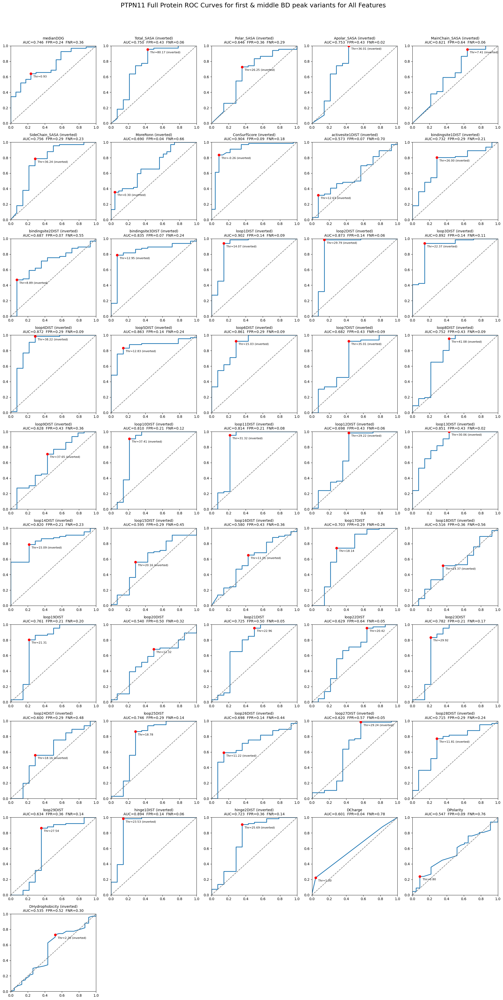

In [557]:
all_features = [
    "medianDDG", "Total_SASA", "Polar_SASA", "Apolar_SASA", "MainChain_SASA",
    "SideChain_SASA", "MoreRonn", "ConSurfScore",
    "activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST"
] + [f"loop{i}DIST" for i in range(1, 30)] + [
    "hinge1DIST", "hinge2DIST",
    "DCharge", "DPolarity", "DHydrophobicity"
]


results_all = plotROC_all_features(
    df=logreg_data_incConfB_BD05,
    features=all_features,
    label_col="PathvBen_incConfB",
    gene=gene,
    title = f"{gene+' ' if gene else ''}Full Protein ROC Curves for first & middle BD peak variants for All Features"
)

In [429]:
counts = pd.crosstab(
    logreg_data_incConfB_BD05["DPolarityCat"],
    logreg_data_incConfB_BD05["PathvBen_incConfB"]
)


display(counts)


PathvBen_incConfB,0.0,1.0
DPolarityCat,,
NN,7,12
NP,2,6
Npos,0,2
PN,3,5
PP,4,8
Pneg,0,4
Ppos,1,8
negN,0,6
negP,0,4


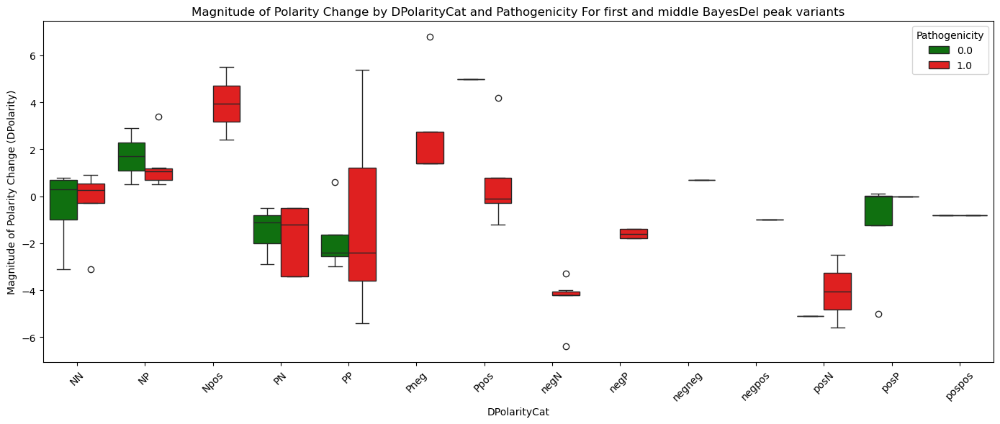

In [437]:
plt.figure(figsize=(14,6))
sns.boxplot(
    data=logreg_data_incConfB_BD05,
    x='DPolarityCat',
    y='DPolarity',
    hue='PathvBen_incConfB',  # 0 = benign, 1 = pathogenic
    palette={0:'green', 1:'red'},
    order = sorted(logreg_data_incConfB_BD05["DPolarityCat"].unique())
)
plt.xticks(rotation=45)
plt.xlabel("DPolarityCat")
plt.ylabel("Magnitude of Polarity Change (DPolarity)")
plt.title("Magnitude of Polarity Change by DPolarityCat and Pathogenicity For first and middle BayesDel peak variants")
plt.legend(title="Pathogenicity", loc='upper right')
plt.tight_layout()
plt.show()


#### Classifying first peak of REVEL

In [432]:
logreg_data_incConfB_REVEL0 = logreg_data_incConfB[
    logreg_data_incConfB["REVELpeak"] == 0
].copy()

logreg_data_incConfB_norm_REVEL0 = logreg_data_incConfB_norm[
    logreg_data_incConfB["REVELpeak"] == 0
].copy()

In [582]:
logreg_y = logreg_data_incConfB_norm_REVEL0[["PathvBen_incConfB"]]
logreg_x = logreg_data_incConfB_norm_REVEL0[[#"REVEL",# "BayesDel_noAF", "BayesDel_addAF", "predREVELnum", "predBDnum", "predBDAFnum",
                                 #"REVELpeak", "BDpeak", "BDAFpeak",
                                 "medianDDG", 
                                 "Total_SASA", #"Polar_SASA", "Apolar_SASA", "MainChain_SASA","SideChain_SASA",
                                 "MoreRonn",
                                "ConSurfScore", #"ConSurfGrade",
                                 "activesite1DIST", #"bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST",
                                #"hinge1DIST", "hinge2DIST",
                                 "loop29DIST",
                                 #"loop1DIST", "loop2DIST", "loop3DIST", "loop4DIST","loop5DIST", "loop7DIST", "loop8DIST", "loop9DIST", "loop10DIST","loop11DIST", "loop13DIST", "loop14DIST", "loop15DIST", "loop16DIST","loop17DIST", "loop18DIST","loop19DIST", "loop20DIST", "loop21DIST", "loop22DIST","loop23DIST", "loop25DIST","loop27DIST", = v highly correlated 
                                 #"loop6DIST","loop12DIST","loop24DIST", "loop26DIST","loop28DIST", = overlamp wih active, binding, hinges
                                 #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                                 #"DCharge", 
                                "DHydrophobicity",
                                "DPolarity",
                                 #"DPolarityCat_NN", "DPolarityCat_NP", "DPolarityCat_PN", "DPolarityCat_PP","DPolarityCat_negN", "DPolarityCat_Ppos"
                                 #"DPolarityCat_negneg", "DPolarityCat_posN", "DPolarityCat_posP","DPolarityCat_pospos","DPolarityCat_Nneg","DPolarityCat_Npos", "DPolarityCat_Pneg", ,"DPolarityCat_negpos", "DPolarityCat_posneg"
                                 
                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)


Optimization terminated successfully.
         Current function value: 0.323187
         Iterations 8


In [583]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:      PathvBen_incConfB   No. Observations:                   27
Model:                          Logit   Df Residuals:                       19
Method:                           MLE   Df Model:                            7
Date:                Fri, 05 Dec 2025   Pseudo R-squ.:                  0.5295
Time:                        09:16:08   Log-Likelihood:                -8.7260
converged:                       True   LL-Null:                       -18.548
Covariance Type:            nonrobust   LLR p-value:                  0.006393
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
medianDDG          -0.4608      2.202     -0.209      0.834      -4.777       3.856
Total_SASA         -1.2110      1.144     -1.059      0.290      -3.453       1.031
MoreRonn            0.2088      

##### Find optimal cutoffs

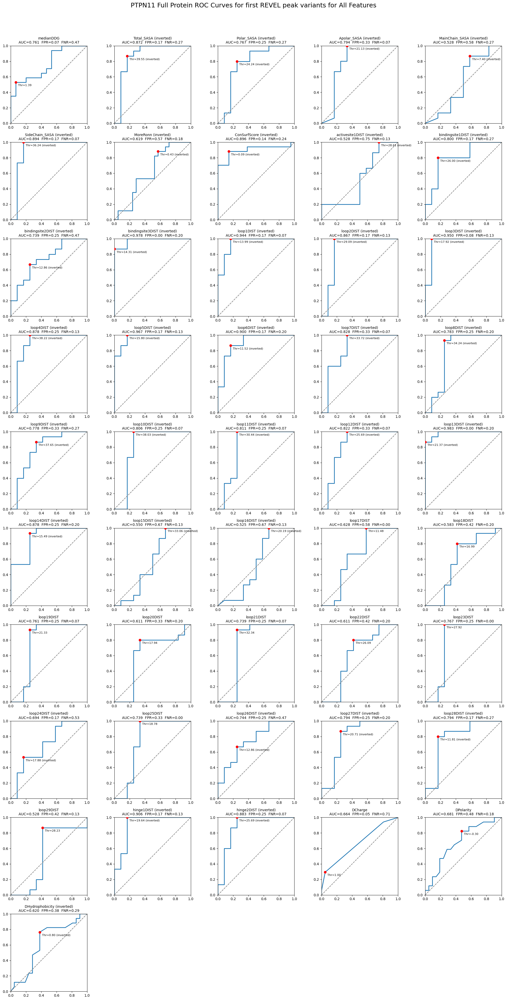

In [558]:
all_features = [
    "medianDDG", "Total_SASA", "Polar_SASA", "Apolar_SASA", "MainChain_SASA",
    "SideChain_SASA", "MoreRonn", "ConSurfScore",
    "activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST"
] + [f"loop{i}DIST" for i in range(1, 30)] + [
    "hinge1DIST", "hinge2DIST",
    "DCharge", "DPolarity", "DHydrophobicity"
]


results_all = plotROC_all_features(
    df=logreg_data_incConfB_REVEL0,
    features=all_features,
    label_col="PathvBen_incConfB",
    gene=gene,
    title = f"{gene+' ' if gene else ''}Full Protein ROC Curves for first REVEL peak variants for All Features"
)

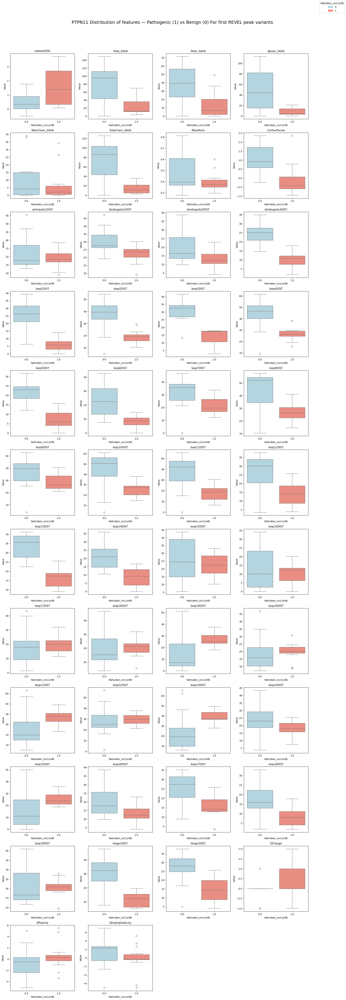

In [585]:
plotBox_all_features(
    df=logreg_data_incConfB_REVEL0,
    features=all_features,
    label_col="PathvBen_incConfB",
    title=f"{gene} Distribution of features — Pathogenic (1) vs Benign (0) For first REVEL peak variants"
)


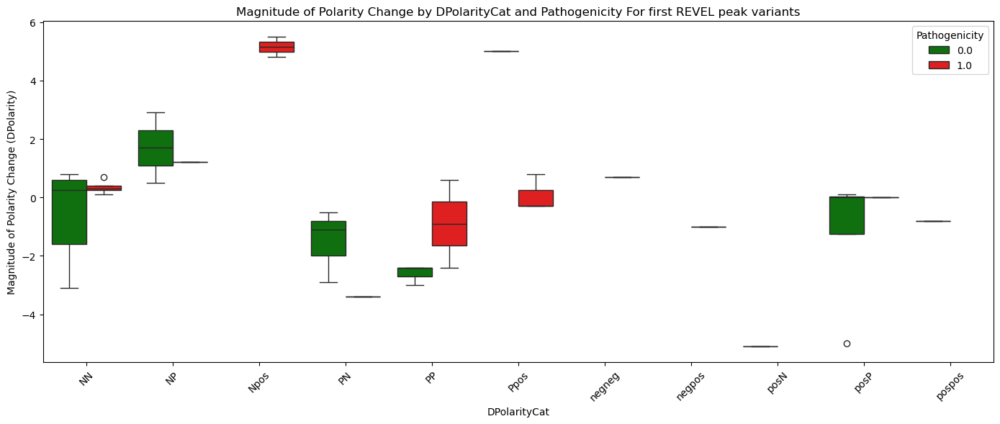

In [441]:
plt.figure(figsize=(14,6))
sns.boxplot(
    data=logreg_data_incConfB_REVEL0,
    x='DPolarityCat',
    y='DPolarity',
    hue='PathvBen_incConfB',  # 0 = benign, 1 = pathogenic
    palette={0:'green', 1:'red'},
    order = sorted(logreg_data_incConfB_REVEL0["DPolarityCat"].unique())
)
plt.xticks(rotation=45)
plt.xlabel("DPolarityCat")
plt.ylabel("Magnitude of Polarity Change (DPolarity)")
plt.title("Magnitude of Polarity Change by DPolarityCat and Pathogenicity For first REVEL peak variants")
plt.legend(title="Pathogenicity", loc='upper right')
plt.tight_layout()
plt.show()


#### Misc KEEP CORRELATION CELLS

In [191]:
logreg_x_clean.nunique()


Total_SASA           65
activesite1DIST      68
hinge1DIST           68
hinge2DIST           68
loop29DIST           68
DCharge               4
DHydrophobicity      53
DPolarityCat_NN       2
DPolarityCat_NP       2
DPolarityCat_PN       2
DPolarityCat_PP       2
DPolarityCat_negN     2
DPolarityCat_Ppos     2
dtype: int64

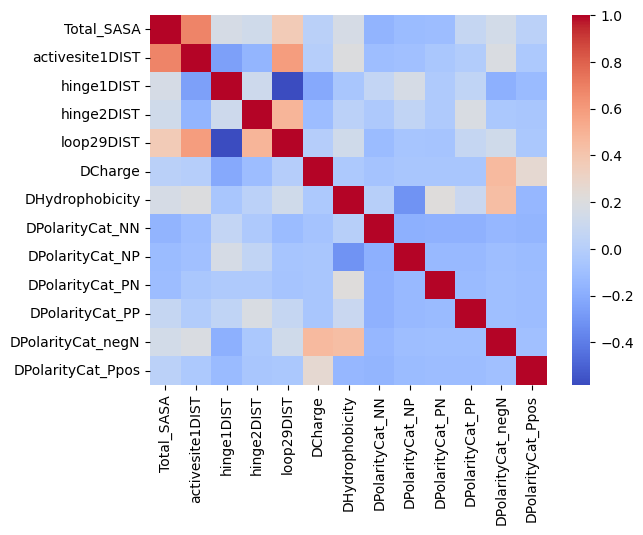

In [192]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(logreg_x_clean.corr(), annot=False, cmap="coolwarm")
plt.show()


In [193]:
logreg_x_clean.dtypes


Total_SASA           float64
activesite1DIST      float64
hinge1DIST           float64
hinge2DIST           float64
loop29DIST           float64
DCharge                int64
DHydrophobicity      float64
DPolarityCat_NN        int32
DPolarityCat_NP        int32
DPolarityCat_PN        int32
DPolarityCat_PP        int32
DPolarityCat_negN      int32
DPolarityCat_Ppos      int32
dtype: object

In [181]:
logreg_y = logreg_data_incConfB[["PathvBen_incConfB"]]
logreg_x = logreg_data_incConfB[[#"REVEL",# "BayesDel_noAF", "BayesDel_addAF", "predREVELnum", "predBDnum", "predBDAFnum",
                                 #"REVELpeak", "BDpeak", "BDAFpeak",
                                 #"medianDDG", 
                                 "Total_SASA", #"Polar_SASA", "Apolar_SASA", "MainChain_SASA","SideChain_SASA",
                                 #"MoreRonn",
                                #"ConSurfScore", #"ConSurfGrade",
                                 "activesite1DIST", #"bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST",
                                "hinge1DIST", "hinge2DIST",
                                 "loop29DIST",
                                 #"loop1DIST", "loop2DIST", "loop3DIST", "loop4DIST","loop5DIST", "loop7DIST", "loop8DIST", "loop9DIST", "loop10DIST","loop11DIST", "loop13DIST", "loop14DIST", "loop15DIST", "loop16DIST","loop17DIST", "loop18DIST","loop19DIST", "loop20DIST", "loop21DIST", "loop22DIST","loop23DIST", "loop25DIST","loop27DIST", = v highly correlated 
                                 #"loop6DIST","loop12DIST","loop24DIST", "loop26DIST","loop28DIST", = overlamp wih active, binding, hinges
                                 #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                                 "DCharge", "DHydrophobicity",
                                #"DPolarity",
                                 "DPolarityCat_NN", "DPolarityCat_NP", "DPolarityCat_PN", "DPolarityCat_PP","DPolarityCat_negN", "DPolarityCat_Ppos"
                                 #"DPolarityCat_negneg", "DPolarityCat_posN", "DPolarityCat_posP","DPolarityCat_pospos","DPolarityCat_Nneg","DPolarityCat_Npos", "DPolarityCat_Pneg", ,"DPolarityCat_negpos", "DPolarityCat_posneg"
                                 
                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

Loops 24, 26 and 28 overlap with active and binding sites. Active site is at binding site 2. Loops 6 and 12 overlap with hinge sites

six DPolarityCat have count >10

Why still singular?
- Linear dependent that does not show up in pairwise correlations. If rank < number of columns still have multicollinearity
- Dummy variable traps
- Variable with zero variance
- Too many predictors for the number of samples

In [206]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:      PathvBen_incConfB   No. Observations:                  149
Model:                          Logit   Df Residuals:                      141
Method:                           MLE   Df Model:                            7
Date:                Mon, 01 Dec 2025   Pseudo R-squ.:                 -0.9683
Time:                        17:05:32   Log-Likelihood:                -91.387
converged:                       True   LL-Null:                       -46.429
Covariance Type:            nonrobust   LLR p-value:                     1.000
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Total_SASA         -0.4272      0.285     -1.499      0.134      -0.986       0.131
activesite1DIST    -0.4196      0.510     -0.822      0.411      -1.420       0.581
hinge1DIST         -0.1260      

In [202]:
logreg_x_clean.corr().abs()

,Total_SASA,activesite1DIST,hinge1DIST,hinge2DIST,loop29DIST,DCharge,DHydrophobicity,DPolarityCat_NN,DPolarityCat_NP,DPolarityCat_PN,DPolarityCat_PP,DPolarityCat_negN,DPolarityCat_Ppos
Total_SASA,1.000000,0.681140,0.164964,0.128590,0.369021,0.020419,0.164699,0.166529,0.124346,0.114012,0.078057,0.146057,0.024353
activesite1DIST,0.681140,1.000000,0.257893,0.158379,0.586543,0.000574,0.201586,0.110821,0.097791,0.055620,0.015776,0.185775,0.043188
hinge1DIST,0.164964,0.257893,1.000000,0.118042,0.582177,0.215321,0.059296,0.066755,0.164840,0.028334,0.052673,0.180528,0.127009
hinge2DIST,0.128590,0.158379,0.118042,1.000000,0.483675,0.115574,0.026737,0.033574,0.058470,0.029785,0.181185,0.047144,0.062485
loop29DIST,0.369021,0.586543,0.582177,0.483675,1.000000,0.005928,0.128983,0.122243,0.068152,0.069719,0.075127,0.133288,0.050609
DCharge,0.020419,0.000574,0.215321,0.115574,0.005928,1.000000,0.043074,0.079196,0.059717,0.057814,0.057814,0.459762,0.263632
DHydrophobicity,0.164699,0.201586,0.059296,0.026737,0.128983,0.043074,1.000000,0.009254,0.312088,0.219519,0.094118,0.440433,0.144663
DPolarityCat_NN,0.166529,0.110821,0.066755,0.033574,0.122243,0.079196,0.009254,1.000000,0.182225,0.176419,0.176419,0.145492,0.158309
DPolarityCat_NP,0.124346,0.097791,0.164840,0.058470,0.068152,0.059717,0.312088,0.182225,1.000000,0.133026,0.133026,0.109706,0.119371
DPolarityCat_PN,0.114012,0.055620,0.028334,0.029785,0.069719,0.057814,0.219519,0.176419,0.133026,1.000000,0.128788,0.106211,0.115567


In [203]:
# Compute absolute correlation matrix
corr_matrix = logreg_x_clean.corr().abs()

# Select only the upper triangle (to avoid duplicates and self-correlation)
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find pairs with correlation > 0.9
high_corr = upper_tri.stack().reset_index()
high_corr.columns = ['Predictor1', 'Predictor2', 'Correlation']
high_corr = high_corr[high_corr['Correlation'] > 0.5]
high_corr.sort_values(by='Correlation', ascending=False, inplace=True)

# Print the result
print(high_corr)


         Predictor1       Predictor2  Correlation
0        Total_SASA  activesite1DIST     0.681140
14  activesite1DIST       loop29DIST     0.586543
24       hinge1DIST       loop29DIST     0.582177


In [183]:
(X_rank, X_cols) = (np.linalg.matrix_rank(logreg_x_clean), logreg_x_clean.shape[1])
print("Matrix rank:", X_rank)
print("Number of columns:", X_cols)


Matrix rank: 13
Number of columns: 13


In [201]:
logreg_x_clean.var(numeric_only=True)


Total_SASA           1.411946
activesite1DIST      1.058861
hinge1DIST           1.333393
hinge2DIST           1.114741
loop29DIST           1.067872
DCharge              0.342463
DHydrophobicity      0.973113
DPolarityCat_NN      0.157809
DPolarityCat_NP      0.106929
DPolarityCat_PN      0.101759
DPolarityCat_PP      0.101759
DPolarityCat_negN    0.074551
DPolarityCat_Ppos    0.085707
dtype: float64

In [175]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

         Current function value: 0.080498
         Iterations: 35


C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [133]:
# Fit with L2 penalty (ridge)
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit_regularized(alpha=0.01)

# Print summary of coefficients
print(pd.DataFrame({
    'Predictor': logreg_x_clean.columns,
    'Coefficient': log_reg.params
}).sort_values(by='Coefficient', key=abs, ascending=False))

Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.03755448786834213
            Iterations: 289
            Function evaluations: 297
            Gradient evaluations: 289
                           Predictor  Coefficient
ConSurfScore            ConSurfScore   -19.032289
DPolarityCat_PN      DPolarityCat_PN    14.886382
medianDDG                  medianDDG     9.019869
DPolarityCat_negN  DPolarityCat_negN     5.719251
DPolarityCat_NN      DPolarityCat_NN     5.233331
DPolarityCat_NP      DPolarityCat_NP     2.852460
DPolarityCat_PP      DPolarityCat_PP    -2.474442
hinge1DIST                hinge1DIST    -1.394957
DHydrophobicity      DHydrophobicity    -1.153126
hinge2DIST                hinge2DIST     1.149943
activesite1DIST      activesite1DIST     0.522942
loop29DIST                loop29DIST    -0.501867
Total_SASA                Total_SASA     0.105971
MoreRonn                    MoreRonn     0.000000
DCharge                      DCharge

C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py:2443: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q * linpred)))


                           Logit Regression Results                           
Dep. Variable:      PathvBen_incConfB   No. Observations:                  149
Model:                          Logit   Df Residuals:                      136
Method:                           MLE   Df Model:                           12
Date:                Mon, 01 Dec 2025   Pseudo R-squ.:                  0.8933
Time:                        14:41:20   Log-Likelihood:                -4.9552
converged:                       True   LL-Null:                       -46.429
Covariance Type:            nonrobust   LLR p-value:                 1.127e-12
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
medianDDG             9.0199      7.511      1.201      0.230      -5.701      23.741
Total_SASA            0.1060      0.123      0.861      0.389      -0.135       0.347
MoreRonn                

medianDDG            0.390456
Total_SASA           0.543876
MoreRonn             0.849978
ConSurfScore         0.383971
activesite1DIST      0.588060
hinge1DIST           0.464154
hinge2DIST           0.448307
loop29DIST           0.606724
DCharge              0.660690
DHydrophobicity      0.243885
DPolarityCat_NN      0.526210
DPolarityCat_NP      0.705291
DPolarityCat_PN      0.488718
DPolarityCat_PP      0.893878
DPolarityCat_negN    0.759540
DPolarityCat_Ppos    0.957473
dtype: float64


In [80]:
alphas = [0.01, 0.1, 1, 10]
for a in alphas:
    log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit_regularized(alpha=a)
    print(f"Alpha={a}")
    print(log_reg.params.sort_values(key=abs, ascending=False).head(5))
    print("-"*40)


C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py:2443: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q * linpred)))


Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.0022572628332230126
            Iterations: 753
            Function evaluations: 769
            Gradient evaluations: 753
Alpha=0.01
DPolarityCat_PP   -6.524657
medianDDG          2.923411
loop29DIST         2.726578
loop8DIST         -2.569269
loop10DIST         2.467763
dtype: float64
----------------------------------------
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.014160508051861587
            Iterations: 351
            Function evaluations: 366
            Gradient evaluations: 351
Alpha=0.1
DPolarityCat_PP   -3.251239
loop29DIST         1.576265
loop8DIST         -1.541944
medianDDG          1.458064
loop10DIST         1.443753
dtype: float64
----------------------------------------
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.05992188437159574
            Iterations: 137
            Functi

In [81]:
log_reg_l1 = sm.Logit(logreg_y_clean, logreg_x_clean).fit_regularized(method='l1', alpha=0.1)

# Check which coefficients were set to exactly 0
coef_df = pd.DataFrame({
    'Predictor': logreg_x_clean.columns,
    'Coefficient': log_reg_l1.params
})
print(coef_df[coef_df['Coefficient'] != 0])


Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.014160508051861587
            Iterations: 351
            Function evaluations: 366
            Gradient evaluations: 351
                         Predictor  Coefficient
medianDDG                medianDDG     1.458064
Total_SASA              Total_SASA    -0.125026
ConSurfScore          ConSurfScore    -0.230001
bindingsite3DIST  bindingsite3DIST     1.031138
hinge2DIST              hinge2DIST    -0.105139
loop5DIST                loop5DIST    -1.140772
loop7DIST                loop7DIST    -0.311251
loop8DIST                loop8DIST    -1.541944
loop10DIST              loop10DIST     1.443753
loop12DIST              loop12DIST    -0.027221
loop14DIST              loop14DIST    -0.501569
loop19DIST              loop19DIST    -0.304281
loop20DIST              loop20DIST     0.050521
loop22DIST              loop22DIST    -1.309582
loop23DIST              loop23DIST     0.703606
loop29DIST       

In [82]:
from statsmodels.discrete.discrete_model import check_perfect_prediction

check_perfect_prediction(logreg_y_clean, logreg_x_clean)


ImportError: cannot import name 'check_perfect_prediction' from 'statsmodels.discrete.discrete_model' (C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py)

In [155]:
import pandas as pd

for col in logreg_x_clean.columns:
    vals = logreg_x_clean[col].unique()
    if len(vals) <= 2:  # binary or categorical-like
        # check if one value predicts outcome perfectly
        for v in vals:
            subset = logreg_y_clean[logreg_x_clean[col] == v]
            if subset.nunique() == 1:
                print(f"Column '{col}' value '{v}' perfectly predicts outcome {subset.iloc[0]}")


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [76]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

         Current function value: inf
         Iterations: 35


LinAlgError: Singular matrix

In [ ]:
from statsmodels.discrete.discrete_model import Logit

try:
    sm.Logit(logreg_y_clean, logreg_x_clean).fit(disp=0)
except Exception as e:
    print(e)


In [75]:
import numpy as np
import pandas as pd



Matrix rank: 46
Number of columns: 46


In [78]:
np.linalg.matrix_rank(logreg_x_clean), logreg_x_clean.shape


(46, (149, 46))

In [77]:
logreg_x_clean.corr().abs()


,REVEL,medianDDG,Total_SASA,MoreRonn,ConSurfScore,activesite1DIST,bindingsite1DIST,bindingsite2DIST,bindingsite3DIST,hinge1DIST,hinge2DIST,loop1DIST,loop2DIST,loop3DIST,loop4DIST,loop5DIST,loop6DIST,loop7DIST,loop8DIST,loop9DIST,loop10DIST,loop11DIST,loop12DIST,loop13DIST,loop14DIST,loop15DIST,loop16DIST,loop17DIST,loop18DIST,loop19DIST,loop20DIST,loop21DIST,loop22DIST,loop23DIST,loop25DIST,loop27DIST,loop29DIST,DCharge,DPolarity,DHydrophobicity,DPolarityCat_NN,DPolarityCat_NP,DPolarityCat_PN,DPolarityCat_PP,DPolarityCat_negN,DPolarityCat_Ppos
REVEL,1.000000,0.260785,0.522699,0.111982,0.603532,0.402705,0.428667,0.443723,0.474983,0.090611,0.006481,0.165129,0.114504,0.389619,0.139045,0.433377,0.020941,0.124957,0.054928,0.134262,0.039089,0.055920,0.003488,0.226821,0.165449,0.193262,0.221731,0.081329,0.316882,0.084260,0.323385,0.122327,0.297635,0.047101,0.102123,0.110603,0.191076,0.048143,0.083791,0.065194,0.013816,0.051176,0.091563,0.014733,0.123273,0.006318
medianDDG,0.260785,1.000000,0.226919,0.168730,0.173674,0.225527,0.221787,0.235885,0.314536,0.011062,0.124777,0.119358,0.008233,0.221807,0.005740,0.196932,0.084524,0.036631,0.026414,0.025894,0.021701,0.003473,0.086275,0.202580,0.084489,0.060184,0.115525,0.138214,0.134556,0.062269,0.158989,0.045054,0.178443,0.045521,0.104145,0.207958,0.181800,0.049749,0.053456,0.214461,0.038941,0.032056,0.081896,0.030960,0.083560,0.039153
Total_SASA,0.522699,0.226919,1.000000,0.112204,0.657417,0.681140,0.604727,0.733718,0.761267,0.164964,0.128590,0.306285,0.222329,0.578528,0.230461,0.691937,0.001838,0.151245,0.248955,0.188822,0.162482,0.128191,0.033015,0.372747,0.508803,0.489571,0.552027,0.400000,0.621073,0.382926,0.554837,0.405854,0.492758,0.317599,0.414880,0.362707,0.369021,0.020419,0.155459,0.164699,0.166529,0.124346,0.114012,0.078057,0.146057,0.024353
MoreRonn,0.111982,0.168730,0.112204,1.000000,0.033796,0.211985,0.306758,0.217286,0.249673,0.140199,0.173954,0.101790,0.173828,0.301836,0.212801,0.328904,0.101591,0.255261,0.135831,0.297900,0.034245,0.053319,0.145881,0.014760,0.007496,0.028826,0.112239,0.089613,0.145839,0.021819,0.264626,0.082834,0.177866,0.026655,0.015098,0.136114,0.018959,0.145221,0.031519,0.011585,0.033783,0.013329,0.010888,0.092555,0.095529,0.164472
ConSurfScore,0.603532,0.173674,0.657417,0.033796,1.000000,0.377267,0.436165,0.428920,0.514026,0.239006,0.200425,0.280869,0.204409,0.486780,0.223346,0.475039,0.187876,0.019606,0.058081,0.025069,0.059160,0.063222,0.129954,0.414731,0.220436,0.166546,0.185202,0.090218,0.276532,0.009852,0.275563,0.033865,0.272866,0.031589,0.047279,0.251379,0.240466,0.113862,0.169962,0.052588,0.000212,0.010807,0.111417,0.169248,0.072757,0.047049
activesite1DIST,0.402705,0.225527,0.681140,0.211985,0.377267,1.000000,0.884481,0.982453,0.854738,0.257893,0.158379,0.099577,0.153066,0.489263,0.086130,0.782159,0.456573,0.511637,0.702696,0.508638,0.651409,0.624779,0.360541,0.092187,0.440891,0.642722,0.781623,0.586128,0.939523,0.726452,0.944507,0.795434,0.883556,0.722793,0.743999,0.249340,0.586543,0.000574,0.218251,0.201586,0.110821,0.097791,0.055620,0.015776,0.185775,0.043188
bindingsite1DIST,0.428667,0.221787,0.604727,0.306758,0.436165,0.884481,1.000000,0.873725,0.858297,0.099634,0.106923,0.043136,0.008803,0.742384,0.094447,0.825620,0.337500,0.524797,0.493532,0.583563,0.432077,0.475703,0.290631,0.299432,0.205413,0.363118,0.527352,0.264415,0.725082,0.380448,0.901593,0.499632,0.848454,0.405880,0.408780,0.168892,0.558988,0.094813,0.138615,0.127210,0.061278,0.017824,0.046614,0.019292,0.096374,0.160644
bindingsite2DIST,0.443723,0.235885,0.733718,0.217286,0.428920,0.982453,0.873725,1.000000,0.910810,0.126538,0.106309,0.038812,0.023605,0.553796,0.031919,0.851482,0.338401,0.448872,0.636008,0.454954,0.558817,0.519422,0.301599,0.160285,0.546120,0.685534,0.808159,0.569560,0.928551,0.674399,0.904710,0.746079,0.824971,0.654034,0.695650,0.285114,0.537800,0.009522,0.224518,0.213841,0.136198,0.096592,0.078703,0.001113,0.193495,0.047093
bindingsite3DIST,0.474983,0.314536,0.76

In [66]:
logreg_x_clean.corr().abs()


,REVEL,REVELpeak,BDpeak,BDAFpeak,medianDDG,Total_SASA,MoreRonn,ConSurfScore,activesite1DIST,bindingsite1DIST,...,loop28DIST,loop29DIST,DCharge,DPolarity,DHydrophobicity,DPolarityCat_Nneg,DPolarityCat_Npos,DPolarityCat_Pneg,DPolarityCat_Ppos,DPolarityCat_negpos
REVEL,1.000000,0.924404,0.779846,0.779846,0.260785,0.522699,0.111982,0.603532,0.402705,0.428667,...,0.401713,0.191076,0.048143,0.083791,0.065194,0.065180,0.049628,0.037804,0.006318,0.027840
REVELpeak,0.924404,1.000000,0.739867,0.739867,0.229483,0.424514,0.118285,0.491033,0.389699,0.408498,...,0.364731,0.160604,0.006771,0.131933,0.120467,0.090837,0.009331,0.049016,0.045778,0.059548
BDpeak,0.779846,0.739867,1.000000,1.000000,0.235469,0.439945,0.004366,0.438372,0.415126,0.393788,...,0.431457,0.284469,0.090419,0.019123,0.016165,0.111587,0.124614,0.131188,0.042088,0.030876
BDAFpeak,0.779846,0.739867,1.000000,1.000000,0.235469,0.439945,0.004366,0.438372,0.415126,0.393788,...,0.431457,0.284469,0.090419,0.019123,0.016165,0.111587,0.124614,0.131188,0.042088,0.030876
medianDDG,0.260785,0.229483,0.235469,0.235469,1.000000,0.226919,0.168730,0.173674,0.225527,0.221787,...,0.272482,0.181800,0.049749,0.053456,0.214461,0.197188,0.445849,0.034741,0.039153,0.043985
Total_SASA,0.522699,0.424514,0.439945,0.439945,0.226919,1.000000,0.112204,0.657417,0.681140,0.604727,...,0.730760,0.369021,0.020419,0.155459,0.164699,0.074164,0.084844,0.076258,0.024353,0.034130
MoreRonn,0.111982,0.118285,0.004366,0.004366,0.168730,0.112204,1.000000,0.033796,0.211985,0.306758,...,0.133425,0.018959,0.145221,0.031519,0.011585,0.017874,0.141687,0.035184,0.164472,0.048853
ConSurfScore,0.603532,0.491033,0.438372,0.438372,0.173674,0.657417,0.033796,1.000000,0.377267,0.436165,...,0.402703,0.240466,0.113862,0.169962,0.052588,0.050898,0.005220,0.029015,0.047049,0.019530
activesite1DIST,0.402705,0.389699,0.415126,0.415126,0.225527,0.681140,0.211985,0.377267,1.000000,0.884481,...,0.881006,0.586543,0.000574,0.218251,0.201586,0.092136,0.055232,0.105211,0.043188,0.026662
bindingsite1DIST,0.428667,0.408498,0.393788,0.393788,0.221787,0.604727,0.306758,0.436165,0.884481,1.000000,...,0.727036,0.558988,0.094813,0.138615,0.127210,0.098616,0.023257,0.107165,0.160644,0.013238


In [68]:
#Npos Nneg NP PN; negN posN; PP NN

logreg_data.filter(like="DPolarityCat").sum()

DPolarityCat           NposPNposPPPNNPPPNPNNNNPPposPPPnegPposPposPpos...
DPolarityCat_NN                                                       30
DPolarityCat_NP                                                       17
DPolarityCat_Nneg                                                      2
DPolarityCat_Npos                                                      8
DPolarityCat_PN                                                       17
DPolarityCat_PP                                                       17
DPolarityCat_Pneg                                                      5
DPolarityCat_Ppos                                                     14
DPolarityCat_negN                                                     12
DPolarityCat_negP                                                      4
DPolarityCat_negneg                                                    6
DPolarityCat_negpos                                                    2
DPolarityCat_posN                                  

In [73]:
logreg_y = logreg_data[["PathvBen"]]
logreg_x = logreg_data[["REVELpeak_0.5"]] #, "medianDDG"

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

#logreg_x = logreg_x.astype(float)

In [74]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

Optimization terminated successfully.
         Current function value: 0.555419
         Iterations 8


In [67]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  148
Model:                          Logit   Df Residuals:                      147
Method:                           MLE   Df Model:                            0
Date:                Fri, 28 Nov 2025   Pseudo R-squ.:                  0.2171
Time:                        14:20:52   Log-Likelihood:                -30.667
converged:                       True   LL-Null:                       -39.173
Covariance Type:            nonrobust   LLR p-value:                       nan
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
predREVELnum     4.7095      1.004      4.688      0.000       2.741       6.678


In [68]:
print(log_reg.pvalues) 

predREVELnum    0.000003
dtype: float64


In [71]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  148
Model:                          Logit   Df Residuals:                      147
Method:                           MLE   Df Model:                            0
Date:                Fri, 28 Nov 2025   Pseudo R-squ.:                 -0.2361
Time:                        14:21:17   Log-Likelihood:                -48.424
converged:                       True   LL-Null:                       -39.173
Covariance Type:            nonrobust   LLR p-value:                       nan
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
REVELpeak_1.0     4.4427      1.006      4.417      0.000       2.471       6.414


In [72]:
print(log_reg.pvalues) 

REVELpeak_1.0    0.00001
dtype: float64


In [75]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  148
Model:                          Logit   Df Residuals:                      147
Method:                           MLE   Df Model:                            0
Date:                Fri, 28 Nov 2025   Pseudo R-squ.:                  -1.098
Time:                        14:21:44   Log-Likelihood:                -82.202
converged:                       True   LL-Null:                       -39.173
Covariance Type:            nonrobust   LLR p-value:                       nan
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
REVELpeak_0.5     3.5553      1.014      3.506      0.000       1.568       5.543


In [76]:
print(log_reg.pvalues) 

REVELpeak_0.5    0.000456
dtype: float64


In [25]:
logreg_y = logreg_data[["PathvBen"]]
logreg_x = logreg_data[["medianDDG", "Total_SASA", "MoreRonn", "ConSurfScore", #"predREVELnum"
                        #"activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST","hinge1DIST", "hinge2DIST", #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                        #"loop29DIST",
                        "DCharge", "DPolarity",
                        "DHydrophobicity"
                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

In [26]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

Optimization terminated successfully.
         Current function value: 0.126973
         Iterations 10


In [108]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  143
Model:                          Logit   Df Residuals:                      137
Method:                           MLE   Df Model:                            5
Date:                Fri, 28 Nov 2025   Pseudo R-squ.:                  0.3808
Time:                        14:47:35   Log-Likelihood:                -19.097
converged:                       True   LL-Null:                       -30.839
Covariance Type:            nonrobust   LLR p-value:                 0.0002726
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
activesite1DIST      0.9358      0.416      2.248      0.025       0.120       1.752
bindingsite1DIST    -0.1077      0.121     -0.888      0.375      -0.345       0.130
bindingsite2DIST    -0.8570 

In [109]:
print(log_reg.pvalues) 

activesite1DIST     0.024563
bindingsite1DIST    0.374759
bindingsite2DIST    0.148919
bindingsite3DIST    0.750801
hinge1DIST          0.503152
hinge2DIST          0.028070
dtype: float64


In [16]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  143
Model:                          Logit   Df Residuals:                      132
Method:                           MLE   Df Model:                           10
Date:                Fri, 28 Nov 2025   Pseudo R-squ.:                  0.9084
Time:                        17:44:07   Log-Likelihood:                -2.8254
converged:                       True   LL-Null:                       -30.839
Covariance Type:            nonrobust   LLR p-value:                 2.029e-08
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
medianDDG            3.0681      1.633      1.879      0.060      -0.132       6.269
Total_SASA          -0.1038      0.160     -0.647      0.518      -0.418       0.211
MoreRonn            88.7931 

In [18]:
print(log_reg.pvalues) 

medianDDG           0.060264
Total_SASA          0.517733
MoreRonn            0.279949
ConSurfScore        0.164411
activesite1DIST     0.778745
bindingsite1DIST    0.574623
bindingsite2DIST    0.895761
bindingsite3DIST    0.397075
hinge1DIST          0.224538
hinge2DIST          0.263094
DCharge             0.738002
dtype: float64


In [27]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  143
Model:                          Logit   Df Residuals:                      136
Method:                           MLE   Df Model:                            6
Date:                Sat, 29 Nov 2025   Pseudo R-squ.:                  0.4112
Time:                        12:28:04   Log-Likelihood:                -18.157
converged:                       True   LL-Null:                       -30.839
Covariance Type:            nonrobust   LLR p-value:                 0.0002923
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
medianDDG           0.6751      0.455      1.484      0.138      -0.217       1.567
Total_SASA         -0.0081      0.015     -0.528      0.597      -0.038       0.022
MoreRonn            4.3757      

In [28]:
print(log_reg.pvalues) 

medianDDG          0.137907
Total_SASA         0.597462
MoreRonn           0.114859
ConSurfScore       0.019789
DCharge            0.060876
DPolarity          0.504096
DHydrophobicity    0.229300
dtype: float64


In [50]:
logreg_y = logreg_data[["PathvBen"]]
logreg_x = logreg_data[[#"medianDDG", "Total_SASA", "MoreRonn", "ConSurfScore", #"predREVELnum"
                        #"activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST","hinge1DIST", "hinge2DIST", #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                        #"loop29DIST",
                        "DCharge", "DPolarity","DHydrophobicity",
                        #"DPolarityCat_NN", "DPolarityCat_NP", "DPolarityCat_PN", "DPolarityCat_PP","DPolarityCat_negN", "DPolarityCat_negneg", "DPolarityCat_posN", "DPolarityCat_posP","DPolarityCat_pospos",
                        "DPolarityCat_Nneg","DPolarityCat_Npos", "DPolarityCat_Pneg", "DPolarityCat_Ppos","DPolarityCat_negpos",#  "DPolarityCat_posneg"=0

                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

DPolarityCat           NposPNposPPPNNPPPNPNNNNPPposPPPnegPposPposPpos...
DPolarityCat_NN                                                       30
DPolarityCat_NP                                                       17
DPolarityCat_Nneg                                                      2
DPolarityCat_Npos                                                      8
DPolarityCat_PN                                                       17
DPolarityCat_PP                                                       17
DPolarityCat_Pneg                                                      5
DPolarityCat_Ppos                                                     14
DPolarityCat_negN                                                     12
DPolarityCat_negP                                                      4
DPolarityCat_negneg                                                    6
DPolarityCat_negpos                                                    2
DPolarityCat_posN                                  

In [52]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

         Current function value: inf
         Iterations: 35


C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py:2385: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\discrete\discrete_model.py:2443: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q * linpred)))


LinAlgError: Singular matrix

In [42]:
print(log_reg.summary())

                           Logit Regression Results                           
Dep. Variable:               PathvBen   No. Observations:                  148
Model:                          Logit   Df Residuals:                      143
Method:                           MLE   Df Model:                            4
Date:                Sat, 29 Nov 2025   Pseudo R-squ.:                 -0.8946
Time:                        12:36:18   Log-Likelihood:                -74.216
converged:                       True   LL-Null:                       -39.173
Covariance Type:            nonrobust   LLR p-value:                     1.000
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
DCharge             1.1745      0.370      3.177      0.001       0.450       1.899
DPolarity           0.2119      0.144      1.470      0.142      -0.071       0.494
DHydrophobicity     0.3934      

In [43]:
print(log_reg.pvalues) 

DCharge            0.001488
DPolarity          0.141629
DHydrophobicity    0.003365
DPolarityCat_NN    0.000764
DPolarityCat_NP    0.001304
dtype: float64


### Noonan v LEOPARD

In [511]:
logreg_data_NvL = (NSEuronet_shortdf.copy()
    .dropna(subset=["NoovLEO"])
    .merge(calculatedProperties_df, on = ["AApos", "AAfrom", "AAto"])
    .drop(columns=["Disease", "predREVEL", "predBD", "predBDAF"]))


In [530]:
dupes = NSEuronet_shortdf[
    NSEuronet_shortdf.duplicated(subset=["AApos", "AAfrom", "AAto"], keep=False)
].sort_values(["AApos", "AAfrom", "AAto"])

dupes


,AApos,AAfrom,AAto,Disease,NoovLEO
0,2,T,I,Noonan syndrome,1
1,2,T,I,Noonan syndrome,1
2,2,T,I,NF1-Noonan syndrome,<NA>
3,2,T,I,Noonan syndrome,1
4,2,T,I,Noonan syndrome,1
5,2,T,I,Noonan syndrome,1
6,2,T,I,Noonan syndrome,1
7,2,T,I,Noonan syndrome,1
8,2,T,I,Noonan syndrome,1
9,2,T,I,Noonan syndrome,1


In [512]:
logreg_data_NvL

,AApos,AAfrom,AAto,NoovLEO,REVEL,BayesDel_noAF,BayesDel_addAF,predREVELnum,predBDnum,predBDAFnum,REVELpeak,BDpeak,BDAFpeak,medianDDG,Total_SASA,Polar_SASA,Apolar_SASA,MainChain_SASA,SideChain_SASA,MoreRonn,ConSurfScore,ConSurfGrade,activesite1DIST,bindingsite1DIST,bindingsite2DIST,bindingsite3DIST,loop1DIST,loop2DIST,loop3DIST,loop4DIST,loop5DIST,loop6DIST,loop7DIST,loop8DIST,loop9DIST,loop10DIST,loop11DIST,loop12DIST,loop13DIST,loop14DIST,loop15DIST,loop16DIST,loop17DIST,loop18DIST,loop19DIST,loop20DIST,loop21DIST,loop22DIST,loop23DIST,loop24DIST,loop25DIST,loop26DIST,loop27DIST,loop28DIST,loop29DIST,hinge1DIST,hinge2DIST,Domain_SH2_1,Domain_SH2_2,Domain_TPP,DCharge,DPolarity,DPolarityCat,DHydrophobicity,DPolarityCat_NN,DPolarityCat_NP,DPolarityCat_Nneg,DPolarityCat_Npos,DPolarityCat_PN,DPolarityCat_PP,DPolarityCat_Pneg,DPolarityCat_Ppos,DPolarityCat_negN,DPolarityCat_negP,DPolarityCat_negneg,DPolarityCat_negpos,DPolarityCat_posN,DPolarityCat_posP,DPolarityCat_posneg,DPolarityCat_pospos
0,2,T,I,1,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.629094,30.619216,24.601382,39.540737,37.286003,43.923780,25.572965,29.902617,16.440256,20.706048,11.813074,37.976353,6.411087,19.448170,0,0,0,0,-3.4,PN,5.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,2,T,I,1,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.629094,30.619216,24.601382,39.540737,37.286003,43.923780,25.572965,29.902617,16.440256,20.706048,11.813074,37.976353,6.411087,19.448170,0,0,0,0,-3.4,PN,5.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,2,T,I,1,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.629094,30.619216,24.601382,39.540737,37.286003,43.923780,25.572965,29.902617,16.440256,20.706048,11.813074,37.976353,6.411087,19.448170,0,0,0,0,-3.4,PN,5.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,2,T,I,1,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.629094,30.619216,24.601382,39.540737,37.286003,43.923780,25.572965,29.902617,16.440256,20.706048,11.813074,37.976353,6.411087,19.448170,0,0,0,0,-3.4,PN,5.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,2,T,I,1,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.629094,30.619216,24.601382,39.540737,37.286003,43.923780,25.572965,29.902617,16.440256,20.706048,11.813074,37.976353,6.411087,19.448170,0,0,0,0,-3.4,PN,5.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,2,T,I,1,0.213000,0.010807,0.010807,0,0,0,0.0,0.0,0.0,0.148935,70.353038,49.220175,21.132863,34.116774,36.236264,0.350520,0.792,3.0,23.845230,28.254788,16.440256,14.313013,0.000000,10.719504,17.479466,19.159104,7.792541,6.411087,22.258059,26.465790,29.753970,22.173557,13.683550,16.240129,21.365588,3.755277,18.185293,12.235307,23.640460,22.62909

In [550]:
logreg_y = logreg_data_NvL[["NoovLEO"]]
logreg_x = logreg_data_NvL[[#"REVEL",# "BayesDel_noAF", "BayesDel_addAF", "predREVELnum", "predBDnum", "predBDAFnum",
                                 #"REVELpeak", "BDpeak", "BDAFpeak",
                                 #"medianDDG", 
                                 "Total_SASA", #"Polar_SASA", "Apolar_SASA", "MainChain_SASA","SideChain_SASA",
                                 "MoreRonn", "ConSurfScore", #"ConSurfGrade",
                                 "activesite1DIST", 
                                "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST",
                                "hinge1DIST", "hinge2DIST",
                                 "loop29DIST",
                                 #"loop1DIST", "loop2DIST", "loop3DIST", "loop4DIST","loop5DIST", "loop7DIST", "loop8DIST", "loop9DIST", "loop10DIST","loop11DIST", "loop13DIST", "loop14DIST", "loop15DIST", "loop16DIST","loop17DIST", "loop18DIST","loop19DIST", "loop20DIST", "loop21DIST", "loop22DIST","loop23DIST", "loop25DIST","loop27DIST", = v highly correlated 
                                 #"loop6DIST","loop12DIST","loop24DIST", "loop26DIST","loop28DIST", = overlamp wih active, binding, hinges
                                 #"Domain_SH2_1", "Domain_SH2_2", "Domain_TPP",
                                 "DCharge", "DHydrophobicity",
                                #"DPolarity",
                                 "DPolarityCat_NN", "DPolarityCat_NP", "DPolarityCat_PN", "DPolarityCat_PP","DPolarityCat_negN", "DPolarityCat_Ppos"
                                 #"DPolarityCat_negneg", "DPolarityCat_posN", "DPolarityCat_posP","DPolarityCat_pospos","DPolarityCat_Nneg","DPolarityCat_Npos", "DPolarityCat_Pneg", ,"DPolarityCat_negpos", "DPolarityCat_posneg"
                                 
                       ]]

logreg_x_clean = logreg_x.replace([np.inf, -np.inf], np.nan).dropna()
logreg_y_clean = logreg_y.loc[logreg_x_clean.index]  # Make sure y matches x

In [551]:
log_reg = sm.Logit(logreg_y_clean, logreg_x_clean).fit(method = "newton", skip_hessian = 0)

         Current function value: 0.116887
         Iterations: 35


C:\Users\zcemcel\AppData\Local\anaconda3\envs\modellingRAS1\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [552]:
print(log_reg.summary())


                           Logit Regression Results                           
Dep. Variable:                NoovLEO   No. Observations:                 2158
Model:                          Logit   Df Residuals:                     2140
Method:                           MLE   Df Model:                           17
Date:                Thu, 04 Dec 2025   Pseudo R-squ.:                  0.6688
Time:                        12:12:32   Log-Likelihood:                -252.24
converged:                      False   LL-Null:                       -761.52
Covariance Type:            nonrobust   LLR p-value:                9.676e-206
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Total_SASA           -0.2374      0.046     -5.160      0.000      -0.328      -0.147
MoreRonn            -15.8020      2.849     -5.547      0.000     -21.385     -10.219
ConSurfScore          9.

In [546]:
print(log_reg.pvalues)


Total_SASA           2.465462e-07
MoreRonn             2.905031e-08
ConSurfScore         1.435745e-07
activesite1DIST      3.505934e-05
bindingsite1DIST     6.170612e-02
bindingsite2DIST     4.870616e-11
bindingsite3DIST     6.174791e-04
hinge1DIST           1.073963e-08
hinge2DIST           1.748072e-02
loop29DIST           1.042217e-08
DCharge              1.643189e-02
DHydrophobicity      6.313466e-08
DPolarityCat_NN      9.311094e-04
DPolarityCat_NP      3.360741e-08
DPolarityCat_PN      4.786435e-03
DPolarityCat_PP      2.894803e-08
DPolarityCat_negN    9.998666e-01
DPolarityCat_Ppos    5.194372e-02
dtype: float64


In [159]:
(X_rank, X_cols) = (np.linalg.matrix_rank(logreg_x_clean), logreg_x_clean.shape[1])
print("Matrix rank:", X_rank)
print("Number of columns:", X_cols)


Matrix rank: 15
Number of columns: 15


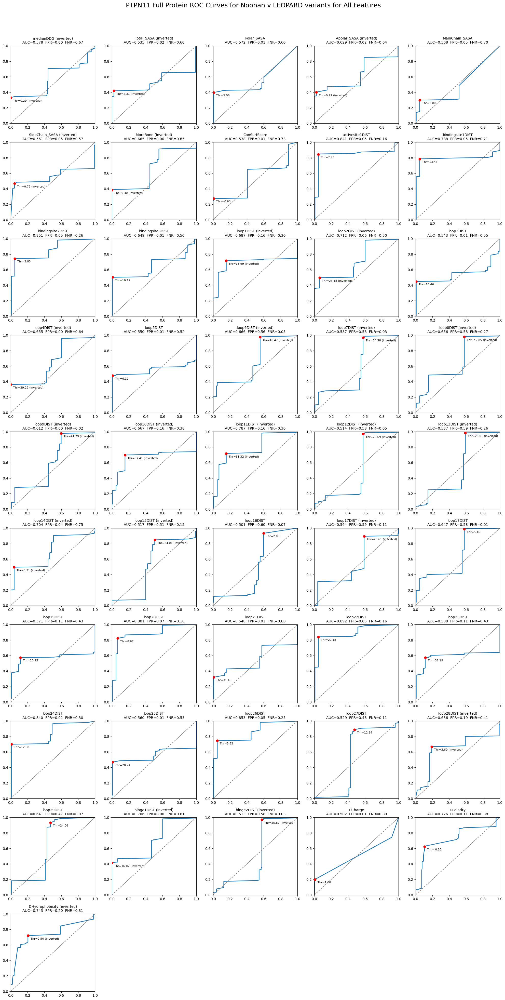

In [559]:
all_features = [
    "medianDDG", "Total_SASA", "Polar_SASA", "Apolar_SASA", "MainChain_SASA",
    "SideChain_SASA", "MoreRonn", "ConSurfScore",
    "activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST"
] + [f"loop{i}DIST" for i in range(1, 30)] + [
    "hinge1DIST", "hinge2DIST",
    "DCharge", "DPolarity", "DHydrophobicity"
]


results_all = plotROC_all_features(
    df=logreg_data_NvL,
    features=all_features,
    label_col="NoovLEO",
    gene=gene,
    title = f"{gene+' ' if gene else ''}Full Protein ROC Curves for Noonan v LEOPARD variants for All Features"
)

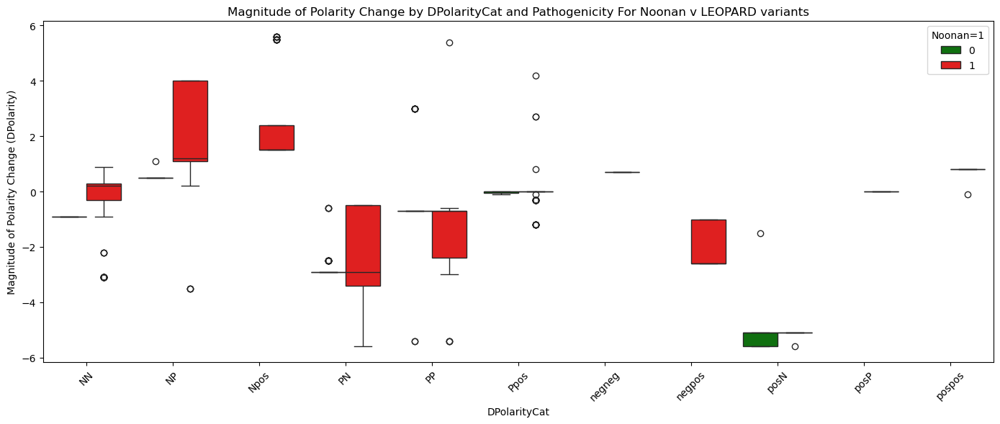

In [526]:
plt.figure(figsize=(14,6))
sns.boxplot(
    data=logreg_data_NvL,
    x='DPolarityCat',
    y='DPolarity',
    hue='NoovLEO',  # 0 = LEOPARD, 1 = Noonan
    palette={0:'green', 1:'red'},
    order = sorted(logreg_data_incConfB_REVEL0["DPolarityCat"].unique())
)
plt.xticks(rotation=45)
plt.xlabel("DPolarityCat")
plt.ylabel("Magnitude of Polarity Change (DPolarity)")
plt.title("Magnitude of Polarity Change by DPolarityCat and Pathogenicity For Noonan v LEOPARD variants")
plt.legend(title="Noonan=1", loc='upper right')
plt.tight_layout()
plt.show()


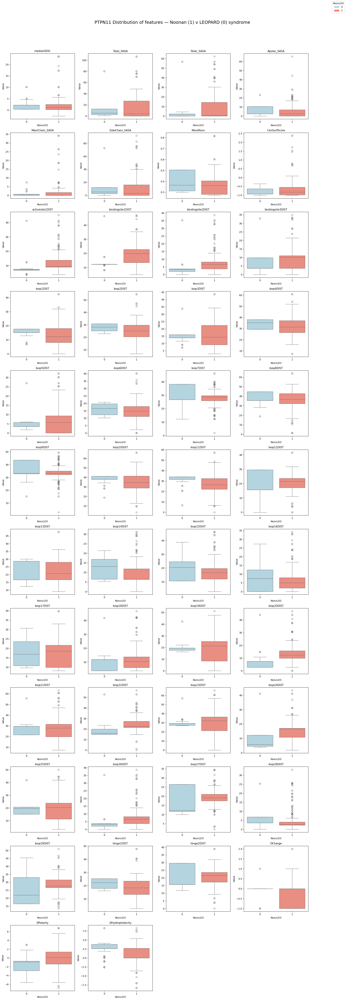

In [579]:
plotBox_all_features(
    df=logreg_data_NvL,
    features=all_features,
    label_col="NoovLEO",
    title=f"{gene} Distribution of features — Noonan (1) v LEOPARD (0) syndrome"
)


#### Noonan v LEOPARD by domain

In [533]:
df = logreg_data_NvL.copy()

# List your domain columns
domain_cols = ["Domain_SH2_1", "Domain_SH2_2", "Domain_TPP"]

# Create a domain label efficiently
df["Domain"] = (
    df[domain_cols]
    .apply(lambda row: "+".join(row.index[row == 1]), axis=1)
    .replace("", "Other")    # if no domains are 1
)

# Crosstab: Noonan (1) vs LEOPARD (0)
domain_counts = pd.crosstab(df["Domain"], df["NoovLEO"])

domain_counts

NoovLEO,0,1
Domain,,
Domain_SH2_1,0,787
Domain_SH2_2,2,82
Domain_TPP,242,1002
Other,0,45


In [532]:
variant_counts = (
    NSEuronet_shortdf
    .groupby(["AApos", "AAfrom", "AAto"])["NoovLEO"]
    .agg(
        count_Noo = lambda x: (x == 1).sum(),
        count_LEO = lambda x: (x == 0).sum(),
        count_na = lambda x: x.isna().sum(),
        total = "count"
    )
    .reset_index()
)

variant_counts


,AApos,AAfrom,AAto,count_Noo,count_LEO,count_na,total
0,2,T,I,9,0,1,9
1,35,S,T,1,0,0,1
2,37,T,I,1,0,0,1
3,42,T,A,49,0,0,49
4,52,T,I,2,0,0,2
5,56,I,V,1,0,0,1
6,57,A,G,1,0,0,1
7,58,N,D,29,0,0,29
8,58,N,H,8,0,0,8
9,58,N,K,18,0,0,18


In [534]:
logreg_data_NvL_PTP = logreg_data_NvL[ logreg_data_NvL["Domain_TPP"] == 1 ].copy()

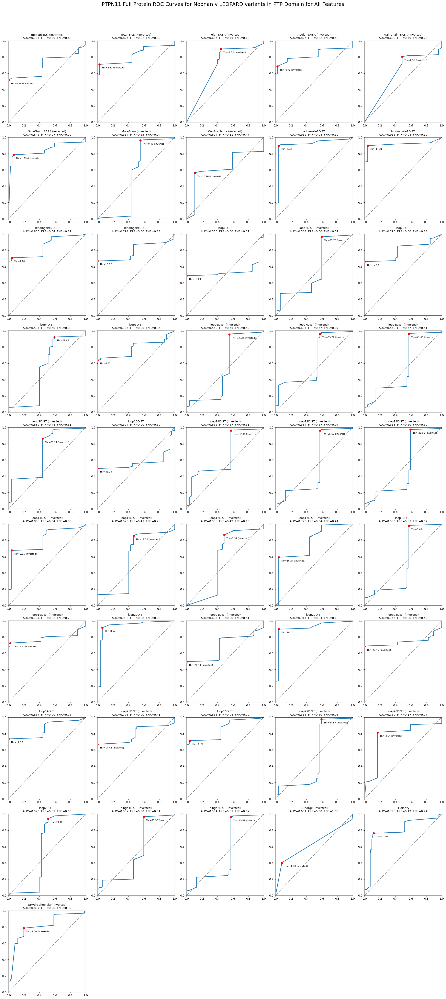

In [542]:
all_features = [
    "medianDDG", "Total_SASA", "Polar_SASA", "Apolar_SASA", "MainChain_SASA",
    "SideChain_SASA", "MoreRonn", "ConSurfScore",
    "activesite1DIST", "bindingsite1DIST", "bindingsite2DIST", "bindingsite3DIST"
] + [f"loop{i}DIST" for i in range(1, 30)] + [
    "hinge1DIST", "hinge2DIST",
    "DCharge", "DPolarity", "DHydrophobicity"
]


results_all = plotROC_all_features(
    df=logreg_data_NvL_PTP,
    features=all_features,
    label_col="NoovLEO",
    gene=gene,
    title = f"{gene+' ' if gene else ''}Full Protein ROC Curves for Noonan v LEOPARD variants in PTP Domain for All Features"
)

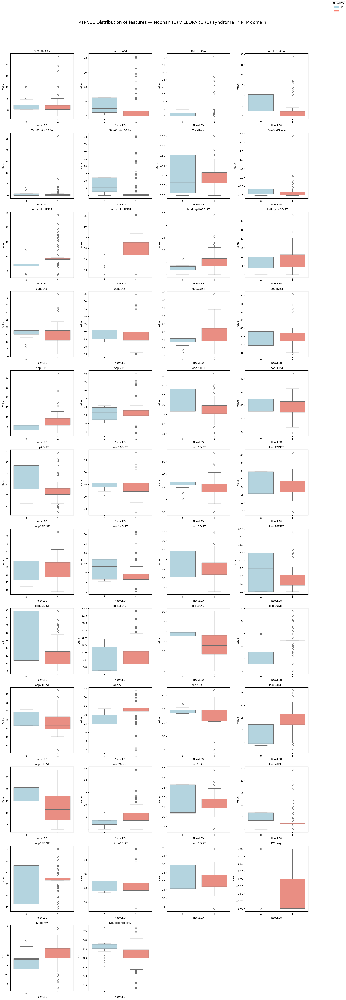

In [580]:
plotBox_all_features(
    df=logreg_data_NvL_PTP,
    features=all_features,
    label_col="NoovLEO",
    title=f"{gene} Distribution of features — Noonan (1) v LEOPARD (0) syndrome in PTP domain"
)
